In [1]:
# import libraries 
import pandas as pd
import numpy as np
import math
from scipy.stats import kurtosis, skew

import matplotlib.pyplot as plt
from matplotlib import colorbar
import seaborn as sns
%matplotlib inline

from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from pickle import dump, load

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)

np.random_state = 42

### Load In Dataset

In [2]:
sd_listings = pd.read_csv('sd_listings', index_col= 0)
sd_listings.head(3)

,id,listing_url,latitude,longitude,zipcode,name,summary,space,description,neighborhood_overview,notes,transit,access,interaction,house_rules,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_id,host_url,host_since,host_about,host_response_time,host_response_rate,host_is_superhost,neighbourhood_cleansed,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,33159143,https://www.airbnb.com/rooms/33159143,32.91736,-117.07635,92131,"PRIVATE ROOM, SAFE NEIGHBORHOOD IN SCRIPPS RANCH",80% of the house + yourCozy room ... in Scripp...,"Full bed, private bath...",80% of the house + yourCozy room ... in Scripp...,The neighborhood is a typical Southern Califor...,Have alarm system if you choose to use... I wi...,You can park in the drive way or plenty of spa...,"Kitchen, Dining room, Living room, Very Comfor...","I lived in San Diego 40+ years, love to share ...",#NAME?,House,Private room,1,1.0,1.0,1.0,Real Bed,"{Wifi,Kitchen,""Free parking on premises"",Heati...",1100.0,1100.0,1000.0,0.0,1,0.0,60,90,249661563,https://www.airbnb.com/users/show/249661563,3/18/19,Retired businessman of 30 years in this commun...,within a few hours,100.0,0,Scripps Ranch,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,strict_14_with_grace_period,0,0
1,17138468,https://www.airbnb.com/rooms/17138468,32.84067,-117.27443,92037,NOT AVAILABLE,AVAILABLE ONLY IN WINTER PRIME La Jolla Villag...,NaN,AVAILABLE ONLY IN WINTER PRIME La Jolla Villag...,NaN,NaN,NaN,NaN,NaN,NaN,Apartment,Entire home/apt,1,2.0,2.0,3.0,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Free park...",1400.0,1400.0,NaN,NaN,1,0.0,30,1125,79755951,https://www.airbnb.com/users/show/79755951,6/24/16,Quiet and considerate.,NaN,0.0,0,La Jolla,1.0,1,0,2,4,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,strict_14_with_grace_period,0,0
2,21898446,https://www.airbnb.com/rooms/21898446,32.79797,-117.24250,92109,Townhome in Pacific Beach,Hi! We are basically renting this master for a...,NaN,Hi! We are basically renting this master for a...,NaN,NaN,NaN,NaN,NaN,NaN,Townhouse,Private room,1,1.0,1.0,1.0,Real Bed,"{TV,Wifi,Kitchen,""Free parking on premises"",""P...",1250.0,1250.0,NaN,NaN,1,0.0,30,30,159773487,https://www.airbnb.com/users/show/159773487,11/22/17,NaN,NaN,0.0,0,Pacific Beach,1.0,1,0,0,0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,flexible,0,0


### Select columns for modeling

In [3]:
sd_listings.columns

Index(['id', 'listing_url', 'latitude', 'longitude', 'zipcode', 'name',
       'summary', 'space', 'description', 'neighborhood_overview', 'notes',
       'transit', 'access', 'interaction', 'house_rules', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'bed_type', 'amenities', 'nightly_price', 'price_per_stay',
       'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people',
       'minimum_nights', 'maximum_nights', 'host_id', 'host_url', 'host_since',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_is_superhost', 'neighbourhood_cleansed',
       'host_total_listings_count', 'host_has_profile_pic',
       'host_identity_verified', 'number_of_reviews', 'number_of_stays',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'requires_license',

In [4]:
modeling_cols = ['id', 'listing_url', 'latitude', 'longitude', 'neighbourhood_cleansed',
               'zipcode', 'property_type', 'room_type', 'accommodates', 
               'bathrooms', 'bedrooms', 'beds',
               'bed_type','nightly_price', 'price_per_stay',
               'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people',
               'minimum_nights', 'maximum_nights','host_response_time', 'host_response_rate',
               'host_is_superhost', 'host_total_listings_count', 'host_has_profile_pic',
               'host_identity_verified', 'number_of_reviews', 'number_of_stays',
               'review_scores_rating', 'review_scores_accuracy',
               'review_scores_cleanliness', 'review_scores_checkin',
               'review_scores_communication', 'review_scores_location',
               'review_scores_value', 'requires_license', 'instant_bookable',
               'is_business_travel_ready', 'cancellation_policy',
               'require_guest_profile_picture', 'require_guest_phone_verification']

In [5]:
sd_modeling = sd_listings[modeling_cols]
sd_modeling.tail(2)

,id,listing_url,latitude,longitude,neighbourhood_cleansed,zipcode,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_time,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
13049,17975942,https://www.airbnb.com/rooms/17975942,32.83598,-117.27878,La Jolla,92037,House,Entire home/apt,21,5.5,7.0,13.0,Real Bed,1305.0,1305.0,1000.0,800.0,21,0.0,1,1125,within an hour,99.0,0,403.0,1,0,4,8,80.0,9.0,8.0,10.0,8.0,10.0,9.0,0,1,0,super_strict_60,0,0
13050,33160513,https://www.airbnb.com/rooms/33160513,32.74357,-117.17679,Midtown,92103,Condominium,Entire home/apt,24,8.0,8.0,10.0,Real Bed,398.0,398.0,500.0,499.0,24,0.0,1,365,within an hour,100.0,1,123.0,1,0,1,2,80.0,10.0,10.0,6.0,10.0,10.0,8.0,0,1,0,super_strict_60,0,0


In [6]:
#checking missing values
sd_modeling.isna().sum()

id                                     0
listing_url                            0
latitude                               0
longitude                              0
neighbourhood_cleansed                 0
zipcode                                0
property_type                          0
room_type                              0
accommodates                           0
bathrooms                              3
bedrooms                               3
beds                                   9
bed_type                               0
nightly_price                          0
price_per_stay                         0
security_deposit                    2674
cleaning_fee                        1504
guests_included                        0
extra_people                           0
minimum_nights                         0
maximum_nights                         0
host_response_time                  2144
host_response_rate                     0
host_is_superhost                      0
host_total_listi

In [7]:
#Imputing missing beds filling missing beds with vaues in bedrooms
sd_modeling['beds'] = sd_modeling['beds'].fillna(sd_modeling['bedrooms'])


### Fill in missing security_deposit, cleaning_fee with 0's

In [8]:
sd_modeling[['security_deposit', 'cleaning_fee']] = sd_modeling[['security_deposit', 'cleaning_fee']].fillna(0)

### Impute missing values in host_response_time

In [9]:
sd_modeling['host_response_time'] = sd_modeling['host_response_time'].fillna('no response')

In [10]:
sd_modeling["host_response_time"].value_counts()

host_response_time
within an hour        8411
no response           2144
within a few hours    1587
within a day           762
a few days or more     147
Name: count, dtype: int64

### Drop remaining rows with missing values
ie. Values that cannot be imputed because of nature of the feature

In [11]:
# Drop rows that has NaN values on selected columns
sd_modeling = sd_modeling.dropna()

In [12]:
sd_modeling.isna().sum()

id                                  0
listing_url                         0
latitude                            0
longitude                           0
neighbourhood_cleansed              0
zipcode                             0
property_type                       0
room_type                           0
accommodates                        0
bathrooms                           0
bedrooms                            0
beds                                0
bed_type                            0
nightly_price                       0
price_per_stay                      0
security_deposit                    0
cleaning_fee                        0
guests_included                     0
extra_people                        0
minimum_nights                      0
maximum_nights                      0
host_response_time                  0
host_response_rate                  0
host_is_superhost                   0
host_total_listings_count           0
host_has_profile_pic                0
host_identit

In [13]:
# convert to appropriate datatype
sd_modeling['bedrooms'] = sd_modeling['bedrooms'].astype(float)
sd_modeling['zipcode'] = sd_modeling['zipcode'].astype(int)
sd_modeling['latitude'] = sd_modeling['latitude'].astype(float)
sd_modeling['longitude'] = sd_modeling['longitude'].astype(float)
sd_modeling['beds'] = sd_modeling['beds'].astype(float).astype(int)
sd_modeling['id'] = sd_modeling['id'].astype(int)

In [14]:
sd_modeling.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13040 entries, 0 to 13050
Data columns (total 42 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                13040 non-null  int64  
 1   listing_url                       13040 non-null  object 
 2   latitude                          13040 non-null  float64
 3   longitude                         13040 non-null  float64
 4   neighbourhood_cleansed            13040 non-null  object 
 5   zipcode                           13040 non-null  int64  
 6   property_type                     13040 non-null  object 
 7   room_type                         13040 non-null  object 
 8   accommodates                      13040 non-null  int64  
 9   bathrooms                         13040 non-null  float64
 10  bedrooms                          13040 non-null  float64
 11  beds                              13040 non-null  int64  
 12  bed_type 

In [15]:
sd_modeling.describe()

,id,latitude,longitude,zipcode,accommodates,bathrooms,bedrooms,beds,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,require_guest_profile_picture,require_guest_phone_verification
count,1.304000e+04,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.000000,13040.0,13040.000000,13040.0,13040.000000,13040.000000
mean,2.137447e+07,32.768302,-117.180227,92119.114724,4.467178,1.507937,1.637960,2.384126,223.751457,531.875153,269.593482,95.210736,2.307899,13.542255,4.749923,619.959202,80.842408,0.368635,42.848543,0.998543,0.486273,34.884509,69.769018,95.596779,9.758589,9.655752,9.856902,9.848696,9.822124,9.545399,0.0,0.515031,0.0,0.027377,0.032439
std,1.050810e+07,0.065387,0.064364,7463.790967,3.009354,0.905070,1.194929,1.900810,344.150092,938.710079,485.396186,104.694193,2.323067,27.612207,15.714078,1297.673611,37.331230,0.482453,175.390234,0.038145,0.499831,60.034597,120.069193,6.446645,0.655233,0.741140,0.526102,0.542996,0.519293,0.760040,0.0,0.499793,0.0,0.163186,0.177169
min,6.000000e+00,32.531040,-117.281990,22000.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.0,0.000000,0.0,0.000000,0.000000
25%,1.358951e+07,32.725277,-117.244425,92101.000000,2.000000,1.000000,1.000000,1.000000,85.000000,130.000000,0.000000,25.000000,1.000000,0.000000,1.000000,29.000000,91.000000,0.000000,1.000000,1.000000,0.000000,2.000000,4.000000,95.000000,10.000000,9.000000,10.000000,10.000000,10.000000,9.000000,0.0,0.000000,0.0,0.000000,0.000000
50%,2.180290e+07,32.757190,-117.167085,92107.000000,4.000000,1.000000,1.000000,2.000000,140.000000,297.500000,100.000000,65.000000,1.000000,0.000000,2.000000,999.000000,100.000000,0.000000,2.000000,1.000000,0.000000,10.000000,20.000000,97.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.0,1.000000,0.0,0.000000,0.000000
75%,3.069297e+07,32.798053,-117.140267,92110.000000,6.000000,2.000000,2.000000,3.000000,250.000000,500.000000,400.000000,130.000000,2.000000,20.000000,3.000000,1125.000000,100.000000,1.000000,9.000000,1.000000,1.000000,41.000000,82.000000,99.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.0,1.000000,0.0,0.000000,0.000000
max,3.786276e+07,33.086070,-116.926530,921096.000000,24.000000,27.500000,14.000000,25.000000,10000.000000,15000.000000,5000.000000,1025.000000,24.000000,300.000000,800.000000,99999.000000,100.000000,1.000000,1737.000000,1.000000,1.000000,786.000000,1572.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.0,1.000000,0.0,1.000000,1.000000


In [16]:
sd_modeling[sd_modeling['zipcode']==92307]

,id,listing_url,latitude,longitude,neighbourhood_cleansed,zipcode,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_time,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
12935,34895037,https://www.airbnb.com/rooms/34895037,32.88529,-117.24642,Torrey Pines,92307,House,Entire home/apt,16,8.0,8.0,8,Real Bed,1518.0,1518.0,1000.0,924.0,16,0.0,1,1125,within an hour,99.0,0,403.0,1,0,0,0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,super_strict_60,0,0


In [17]:
# save as csv
#path = "data/"

sd_modeling.to_csv('sd_modeling_with_urls')

In [18]:
sd_modeling = sd_modeling.drop(columns = 'listing_url')
sd_modeling.head()

,id,latitude,longitude,neighbourhood_cleansed,zipcode,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_time,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,33159143,32.91736,-117.07635,Scripps Ranch,92131,House,Private room,1,1.0,1.0,1,Real Bed,1100.0,1100.0,1000.0,0.0,1,0.0,60,90,within a few hours,100.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,strict_14_with_grace_period,0,0
1,17138468,32.84067,-117.27443,La Jolla,92037,Apartment,Entire home/apt,1,2.0,2.0,3,Real Bed,1400.0,1400.0,0.0,0.0,1,0.0,30,1125,no response,0.0,0,1.0,1,0,2,4,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,strict_14_with_grace_period,0,0
2,21898446,32.79797,-117.24250,Pacific Beach,92109,Townhouse,Private room,1,1.0,1.0,1,Real Bed,1250.0,1250.0,0.0,0.0,1,0.0,30,30,no response,0.0,0,1.0,1,0,0,0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,flexible,0,0
3,25948680,32.77545,-117.05923,College Area,92120,Apartment,Entire home/apt,1,1.0,1.0,1,Real Bed,1150.0,1150.0,0.0,0.0,1,0.0,31,40,no response,0.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,0,0,flexible,0,0
4,1756516,32.84619,-117.27558,La Jolla,92037,Condominium,Private room,1,1.0,1.0,1,Real Bed,110.0,110.0,200.0,0.0,1,50.0,180,365,within a day,67.0,0,6.0,1,1,2,4,90.0,7.0,7.0,8.0,8.0,9.0,10.0,0,0,0,strict_14_with_grace_period,0,0


In [19]:
# save as csv
#path = "data/"

sd_modeling.to_csv('sd_modeling_cleaned')

### Exploring Categorical Features
##### Checking value counts for each categorical feature

In [20]:
cat_cols = sd_modeling.select_dtypes(include=['object']).columns
cat_cols

Index(['neighbourhood_cleansed', 'property_type', 'room_type', 'bed_type',
       'host_response_time', 'cancellation_policy'],
      dtype='object')

In [21]:
for col in cat_cols:
    values = sd_modeling[col].value_counts()
    print(values,'\n')

neighbourhood_cleansed
Mission Bay        1589
Pacific Beach      1040
La Jolla            845
East Village        821
North Hills         737
                   ... 
Lincoln Park          3
Horton Plaza          3
Eastlake Woods        2
Eastlake Trails       1
Thomy Locust Pl       1
Name: count, Length: 103, dtype: int64 

property_type
House                     4569
Apartment                 3391
Condominium               1990
Townhouse                  713
Guesthouse                 481
Guest suite                471
Bungalow                   298
Cottage                    289
Loft                       259
Villa                       88
Serviced apartment          83
Hostel                      72
Camper/RV                   57
Bed and breakfast           48
Other                       39
Boat                        35
Resort                      35
Tiny house                  29
Boutique hotel              26
Hotel                       15
Aparthotel                  12
Tent   

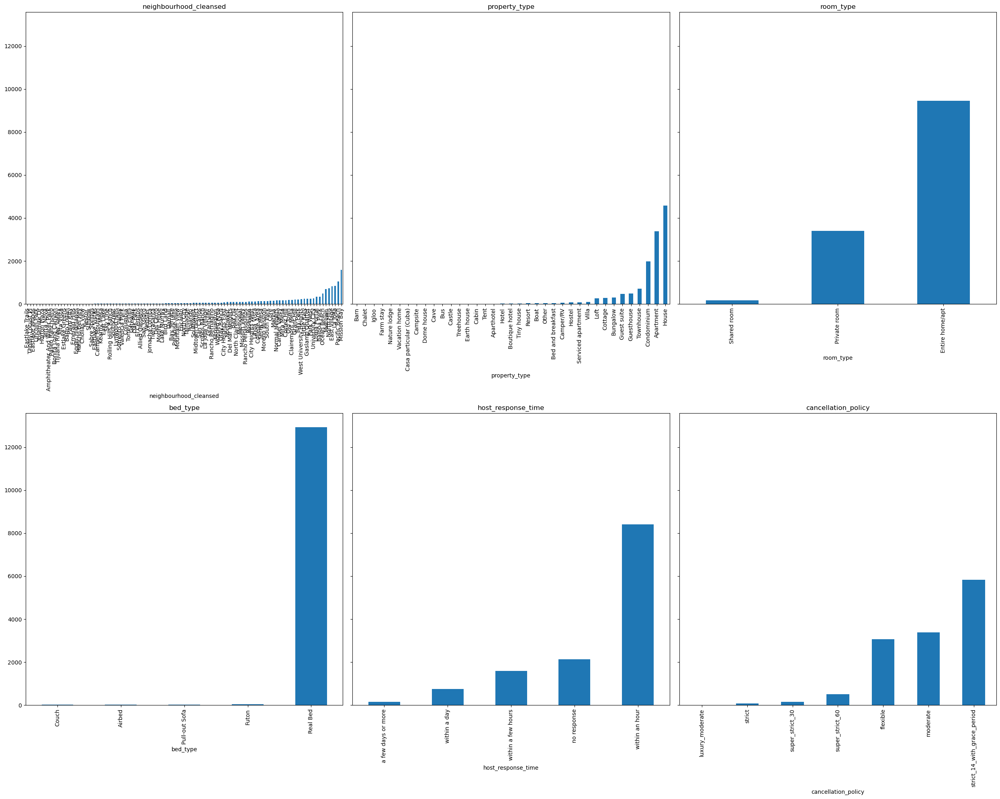

In [22]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25,20), sharey=True)

# Create bar plots
cat_cols = list(cat_cols)

for col, ax in zip(cat_cols, axes.flatten()):
    (sd_modeling.groupby(col)        # group values together by column of interest
         .count()['nightly_price']   # count listings for each category
         .sort_values()              # sort the groups in ascending order
         .plot
         .bar(ax=ax))                # create a bar graph on the ax

    ax.set_title(col)                # Make the title the name of the column

fig.tight_layout()
plt.show()

The bar chart will have:

x-axis: Room types
y-axis: Number of listings

So the height of each bar is the number of listings in that category, not the nightly price.
From these bar plots, you can draw the following insights for your Airbnb project:

### 1. Neighbourhood Distribution

* Listings are **unevenly distributed across neighbourhoods**.
* A few neighbourhoods contain a very large number of listings, while many neighbourhoods have relatively few.
* This indicates that Airbnb activity is concentrated in popular tourist or residential areas.

> Airbnb listings are concentrated in a small number of neighbourhoods, whereas many neighbourhoods have only a limited number of listings, indicating an uneven geographical distribution.

---

### 2. Property Type

* **Apartment** is by far the most common property type.
* **House** and **Condominium** are the next most frequent property types.
* Other property types such as villas, boats, castles, tents, and treehouses are very rare.


> Apartments dominate the Airbnb market, followed by houses and condominiums, while unique property types contribute only a small proportion of listings.

---

### 3. Room Type

* **Entire home/apartment** is the most common room type.
* **Private rooms** are the second most popular.
* **Shared rooms** represent only a very small percentage of listings.

> Most hosts offer entire homes or apartments, suggesting that guests generally prefer private accommodations over shared spaces.

---

### 4. Bed Type

* **Real Bed** overwhelmingly dominates all other bed types.
* Airbeds, futons, couches, and pull-out sofas are extremely uncommon.


> Nearly all listings provide real beds, indicating that standard sleeping arrangements are preferred by both hosts and guests.

---

### 5. Host Response Time

* Most hosts respond **within an hour**.
* Fewer hosts respond within a few hours or within a day.
* Very few hosts take several days to respond.


> The majority of hosts respond within an hour, reflecting high host responsiveness and potentially improving guest satisfaction.

---

### 6. Cancellation Policy

* **Strict with grace period** is the most frequently used cancellation policy.
* **Moderate** and **Flexible** policies are also common.
* **Luxury**, **Super Strict**, and similar policies are very rare.


> Hosts generally prefer stricter cancellation policies, with the "Strict with Grace Period" policy being the most commonly adopted.

---

## Overall Findings

* Airbnb listings are concentrated in specific neighbourhoods.
* Apartments and entire homes dominate the market.
* Most listings provide standard real beds.
* Hosts generally respond quickly, often within an hour.
* Stricter cancellation policies are more prevalent, suggesting hosts prioritize booking security while still allowing limited flexibility.



#### Distribution of numerical features

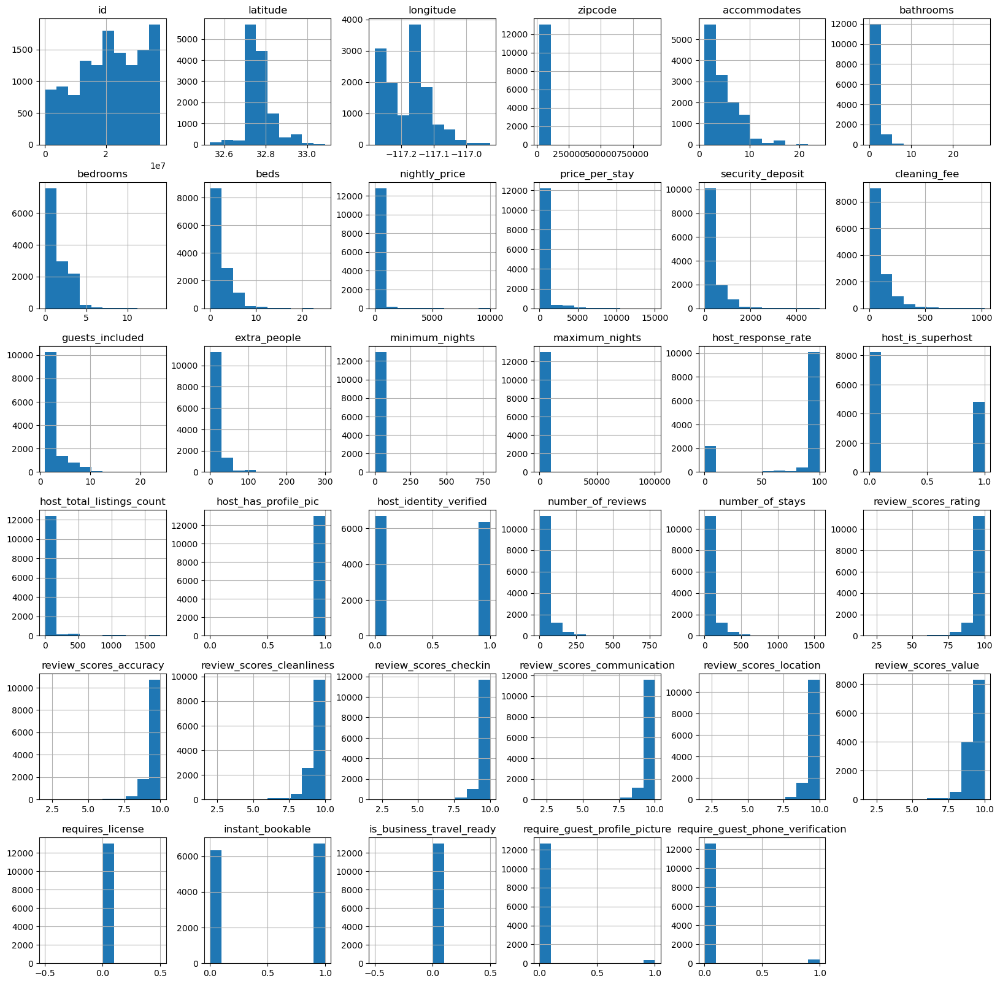

In [23]:
sd_modeling.hist(figsize=(20,20))
plt.show()

Based on these histograms, here are the key insights you can include in your EDA section:

### Overall Distribution

* Most numerical features exhibit **right-skewed (positively skewed)** distributions, where the majority of observations are concentrated at lower values with a few extreme high-value outliers.
* Very few variables follow a normal distribution, indicating that transformations (e.g., log transformation) may be useful before modeling.

### Feature-wise Insights

#### 1. Accommodation Capacity

* **Accommodates, bedrooms, beds, and bathrooms** are all right-skewed.
* Most Airbnb listings are designed for **small groups (1–4 guests)** with relatively few large properties.

**Insight:**

> The majority of listings are small-sized accommodations, while large properties capable of hosting many guests are comparatively rare.

---

#### 2. Pricing Variables

* **Nightly price, price per stay, security deposit, and cleaning fee** show highly right-skewed distributions.
* Most listings have relatively low prices, while a few luxury listings command exceptionally high prices.

**Insight:**

> Pricing-related variables contain several high-value outliers, indicating substantial variation between standard and premium Airbnb properties.

---

#### 3. Booking Requirements

* **Minimum nights** is concentrated at lower values (typically 1–3 nights), although a few listings require much longer stays.
* **Maximum nights** contains extremely large values, suggesting some hosts allow very long-term bookings.

**Insight:**

> Most hosts allow short-term stays, whereas only a small number of listings support extended bookings.

---

#### 4. Host Performance

* **Host response rate** is heavily concentrated near **100%**, indicating that most hosts maintain excellent responsiveness.
* The **host_is_superhost** variable shows that non-superhosts slightly outnumber superhosts.

**Insight:**

> Most hosts maintain very high response rates, demonstrating active engagement with potential guests.

---

#### 5. Host Characteristics

* **Host profile picture** and **host identity verification** are predominantly positive.
* This suggests that most hosts have completed Airbnb's profile verification process.

**Insight:**

> The majority of hosts have verified profiles and profile pictures, increasing the credibility of listings.

---

#### 6. Reviews

* **Number of reviews** and **number of stays** are strongly right-skewed.
* Most listings receive relatively few reviews, while a small number of popular listings accumulate hundreds of reviews.

**Insight:**

> Review activity is concentrated among a limited number of highly popular listings.

---

#### 7. Review Scores

* Rating variables (overall rating, accuracy, cleanliness, check-in, communication, location, and value) are concentrated between **9 and 10**.
* Most listings receive consistently high ratings across all review categories.

**Insight:**

> Airbnb listings generally receive excellent guest ratings, indicating high levels of customer satisfaction.

---

#### 8. Binary Features

* Variables such as **requires_license**, **instant_bookable**, **is_business_travel_ready**, **require_guest_profile_picture**, and **require_guest_phone_verification** are binary.
* Some features are highly imbalanced (e.g., most listings do not require a license or guest profile picture).

**Insight:**

> Several binary variables are highly imbalanced, with one category overwhelmingly dominating the other.

---

### Overall Summary

> The numerical variables are predominantly right-skewed with several extreme outliers, particularly in pricing and booking-related features. Most listings are small accommodations with affordable prices, receive high review scores, and are managed by responsive, verified hosts. These distributions suggest that preprocessing techniques such as outlier handling and logarithmic transformation may improve model performance.


### Correlations Between Features

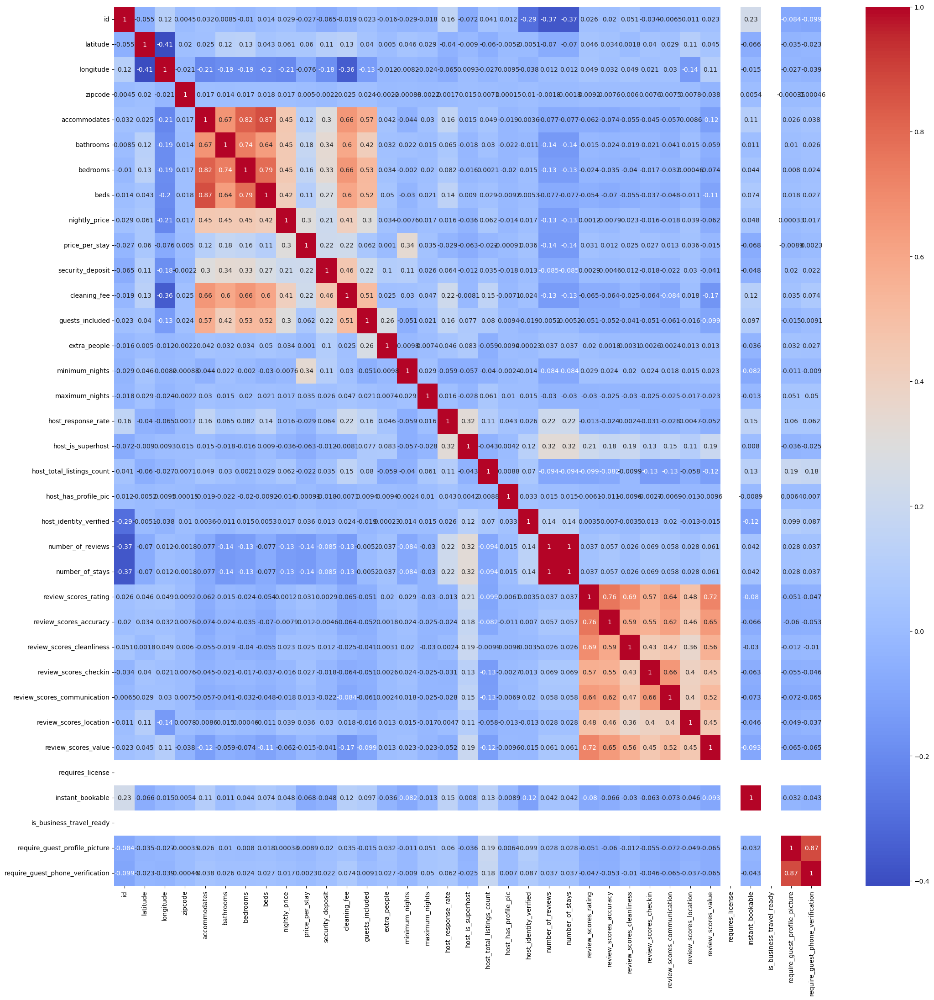

In [24]:
numeric_df = sd_modeling.select_dtypes(include='number')

corr = numeric_df.corr()

fig, ax = plt.subplots(figsize=(25, 25))

sns.heatmap(corr, cmap='coolwarm', annot=True)
plt.show()

### Correlation Heatmap – Key Insights

The correlation heatmap highlights the relationships among numerical Airbnb listing features. The main findings are:

#### 1. Capacity-related features are highly correlated

* **Accommodates, bedrooms, beds, and bathrooms** show strong positive correlations.
* For example:

  * Accommodates ↔ Beds: **0.87**
  * Accommodates ↔ Bedrooms: **0.82**
  * Bedrooms ↔ Beds: **0.79**
  * Bathrooms ↔ Bedrooms: **0.74**
* This is expected because larger properties generally have more bedrooms, beds, and bathrooms.

**Insight:** These variables contain overlapping information, so feature selection or regularization may be useful to reduce multicollinearity.

---

#### 2. Listing price increases with property size

* **Nightly price** has moderate positive correlations with:

  * Accommodates (~0.45)
  * Bedrooms (~0.45)
  * Bathrooms (~0.45)
  * Cleaning fee (~0.41)
* Larger properties generally command higher nightly prices.

**Insight:** Property size is an important determinant of Airbnb pricing.

---

#### 3. Cleaning fee and security deposit are moderately related

* Cleaning fee is positively correlated with:

  * Security deposit (~0.46)
  * Accommodates (~0.66)
  * Bedrooms (~0.66)
* Hosts of larger or premium listings tend to charge higher cleaning fees and security deposits.

---

#### 4. Review score metrics are strongly correlated

* Review-related variables exhibit strong positive relationships:

  * Overall Rating ↔ Accuracy: **0.76**
  * Overall Rating ↔ Value: **0.72**
  * Overall Rating ↔ Cleanliness: **0.69**
  * Check-in ↔ Communication: **0.66**
* Guests who rate one aspect highly tend to rate other aspects positively as well.

**Insight:** Customer satisfaction dimensions are closely linked and reflect overall guest experience.

---

#### 5. Geographic coordinates show moderate correlation

* Latitude and longitude have a moderate negative correlation (~**−0.41**), reflecting the geographical distribution of listings rather than any meaningful business relationship.

---

#### 6. Host verification features are related

* **Require guest profile picture** and **Require guest phone verification** have a very strong positive correlation (**0.87**).
* Hosts requiring one form of verification are likely to require the other.

---

#### 7. Host characteristics have weak influence

* Features such as:

  * Host response rate
  * Host identity verified
  * Host profile picture
  * Host total listings count
* show only weak correlations with price and review scores.

**Insight:** These host attributes alone are not strong predictors of listing price or guest satisfaction.

---

#### 8. Review count and number of stays are perfectly correlated

* **Number of reviews** and **Number of stays** have a correlation close to **1.0**, indicating they capture nearly identical information.

**Insight:** One of these variables may be redundant and can be removed during feature engineering to avoid duplication.

---

#### 9. Most other variables show weak correlations

* Features such as:

  * Minimum nights
  * Maximum nights
  * Extra people fee
  * Instant bookable
  * Business travel ready
* have correlations close to zero with most variables.

**Insight:** These variables contribute unique information and are unlikely to introduce multicollinearity.

---

### Overall Summary

* Property size features (**accommodates, bedrooms, beds, bathrooms**) are strongly correlated and are key drivers of Airbnb pricing.
* Review score metrics are highly correlated, indicating consistent guest satisfaction across different service dimensions.
* Cleaning fee and security deposit increase with listing size and price.
* Host verification features are strongly associated with one another.
* Most remaining variables exhibit weak correlations, suggesting they provide complementary information for predictive modeling.


### Preprocessing Features
##### Categorical features

In [25]:
# Room Type vs Instant Bookable
pd.crosstab(sd_modeling['room_type'], sd_modeling['instant_bookable'])

# Property Type vs Cancellation Policy
pd.crosstab(sd_modeling['property_type'], sd_modeling['cancellation_policy'])

# Host is Superhost vs Instant Bookable
pd.crosstab(sd_modeling['host_is_superhost'], sd_modeling['instant_bookable'])

# Room Type vs Require Guest Phone Verification
pd.crosstab(sd_modeling['room_type'], sd_modeling['require_guest_phone_verification'])

# Cancellation Policy vs Business Travel Ready
pd.crosstab(sd_modeling['cancellation_policy'], sd_modeling['is_business_travel_ready'])

is_business_travel_ready,0
cancellation_policy,
flexible,3075
luxury_moderate,8
moderate,3375
strict,79
strict_14_with_grace_period,5837
super_strict_30,150
super_strict_60,516


In [26]:
cat_cols

['neighbourhood_cleansed',
 'property_type',
 'room_type',
 'bed_type',
 'host_response_time',
 'cancellation_policy']

In [27]:
# first convert zipcode to a dtype object for OHE
sd_modeling['zipcode'] = sd_modeling['zipcode'].astype(object)


The zipcode feature identifies the location of each listing. Different zip codes may have different average prices due to differences in neighborhood, accessibility, and nearby attractions.

Therefore, instead of treating zip codes as numerical values, they are one-hot encoded so that the model can learn the influence of each location without assuming any numerical relationship between zip codes.

Project write-up:

The zipcode feature is treated as a nominal categorical variable because its values represent geographic regions rather than numerical quantities. To make it suitable for machine learning algorithms, One-Hot Encoding (OHE) is applied, creating a separate binary feature for each unique zip code. This allows the model to capture location-specific effects without imposing an artificial numerical order on the zip codes.

#### Establish order of ordinal columns

In [28]:
# convert to categorical dtype
sd_modeling['host_response_time'] = sd_modeling['host_response_time'].astype('category')
sd_modeling['cancellation_policy'] = sd_modeling['cancellation_policy'].astype('category')

The host_response_time and cancellation_policy columns were converted from the default object data type to the category data type because they contain a fixed set of repeated categorical values. Using the category type reduces memory consumption, improves computational efficiency, and prepares these variables for categorical encoding techniques such as One-Hot Encoding before building machine learning models.

In [29]:
# define order of the ordinal features
response_time_list = ['within an hour',
                      'within a few hours', 
                      'within a day', 
                      'a few days or more', 
                      'no response']

cancellation_policy_list = ['flexible',
                            'moderate',
                            'strict',
                            'strict_14_with_grace_period', 
                            'super_strict_60', 
                            'super_strict_30',
                            'luxury_moderate']

In [30]:
# define nominal and ordinal features in the categorical columns
nom_cols = sd_modeling.select_dtypes(['object']).columns
print(nom_cols)
ordinal_cols = sd_modeling.select_dtypes(['category']).columns
print(ordinal_cols)


Index(['neighbourhood_cleansed', 'zipcode', 'property_type', 'room_type',
       'bed_type'],
      dtype='object')
Index(['host_response_time', 'cancellation_policy'], dtype='object')


The main reason for **separating nominal and ordinal categorical variables** is that **they require different encoding methods** before they can be used in machine learning models.

### 1. Nominal variables (No order)

Examples:

* Room type
* Property type
* Zipcode

There is **no natural ranking** among the categories.

Example:

```
Entire home
Private room
Shared room
```

You cannot say one is "greater" or "less" than another.

**Encoding used:** One-Hot Encoding (OHE)

```
Entire home  → 1 0 0
Private room → 0 1 0
Shared room  → 0 0 1
```

---

### 2. Ordinal variables (Have an order)

Examples:

* Host response time
* Cancellation policy (if you define an order)

Example:

```
within an hour
within a few hours
within a day
a few days or more
```

These have a **meaningful order** from fastest to slowest.

**Encoding used:** Ordinal Encoding

```
within an hour      → 0
within a few hours  → 1
within a day        → 2
a few days or more  → 3
```

---

### Why separate them?

If you use the **wrong encoding**, the model may learn incorrect relationships.

* **Nominal → One-Hot Encoding**

  * Prevents the model from assuming an order where none exists.

* **Ordinal → Ordinal Encoding**

  * Preserves the natural ranking of the categories.

### In your Airbnb project

```python
nom_cols = ['room_type', 'property_type', 'zipcode']
```

These are encoded using **One-Hot Encoding**.

```python
ordinal_cols = ['host_response_time', 'cancellation_policy']
```

These are encoded using **Ordinal Encoding** because their categories can be arranged in a meaningful order.

> **We separate nominal and ordinal categorical features because nominal features have no inherent order and require One-Hot Encoding, whereas ordinal features have a natural order and require Ordinal Encoding to preserve that ranking.**


The main reason for creating **separate pipelines** is that **different types of features require different preprocessing techniques**. A machine learning model cannot directly work with raw data containing strings, different scales, or categorical values.

Let's understand each pipeline.

---

## 1. Numeric Pipeline

```python
numeric_pipeline = Pipeline([
    ('numnorm', StandardScaler())
])
```

### Why is it needed?

Numerical columns (like `price`, `bedrooms`, `reviews_per_month`) have different ranges.

Example:

| Feature  | Values        |
| -------- | ------------- |
| bedrooms | 1, 2, 3       |
| price    | 50, 500, 5000 |
| reviews  | 0, 100        |

If you feed these directly into many ML algorithms, the feature with the largest values (price) dominates the others.

### What does `StandardScaler()` do?

It converts every numerical feature to

* Mean = 0
* Standard deviation = 1

Formula

[
z=\frac{x-\mu}{\sigma}
]

Example

Original

```
Bedrooms : [1,2,3]
Price     : [100,500,900]
```

After scaling

```
Bedrooms : [-1.22,0,1.22]
Price     : [-1.22,0,1.22]
```

Now both features contribute equally.

### Role

✔ Makes numerical features comparable.

---

# 2. Ordinal Pipeline

```python
ordinal_pipeline = Pipeline([
    ('ordinalenc',
     OrdinalEncoder(categories=[
         response_time_list,
         cancellation_policy_list
     ]))
])
```

### Why is it needed?

Some categorical variables have a **natural order**.

Example

Host response time

```
within an hour
within a few hours
within a day
a few days
```

Clearly,

```
within an hour
<
within a few hours
<
within a day
<
a few days
```

The model should understand this order.

### OrdinalEncoder converts

```
within an hour        → 0
within a few hours    → 1
within a day          → 2
a few days            → 3
```

The numbers preserve the ranking.

### Why specify `categories=`?

```python
categories=[
response_time_list,
cancellation_policy_list
]
```

This tells sklearn the **correct order**.

Otherwise, it would assign numbers alphabetically, which is incorrect.

Example

Alphabetically

```
a few days
within a day
within a few hours
within an hour
```

This does not represent the true ranking.

### Role

✔ Converts ordered categories into ordered numbers.

---

# 3. Nominal Pipeline

```python
nominal_pipeline = Pipeline([
('onehotenc',
 OneHotEncoder(
     categories='auto',
     sparse=False,
     handle_unknown='ignore'
 ))
])
```

### Why is it needed?

Nominal categories **have no order**.

Example

```
Room Type

Entire home
Private room
Shared room
Hotel room
```

There is no ranking.

If you use

```
Entire home = 0
Private room = 1
Shared room = 2
```

the model may think

```
2 > 1 > 0
```

which is meaningless.

---

### One-Hot Encoding

Instead, create a new column for each category.

Example

Original

| Room Type    |
| ------------ |
| Entire home  |
| Shared room  |
| Private room |

Becomes

| Entire | Shared | Private |
| ------ | ------ | ------- |
| 1      | 0      | 0       |
| 0      | 1      | 0       |
| 0      | 0      | 1       |

Now there is no false ordering.

### Role

✔ Converts unordered categories into binary columns.

---

# Why use `Pipeline()`?

Instead of applying preprocessing manually,

```
Scale numeric

↓

Encode ordinal

↓

Encode nominal
```

the pipeline automates these steps.

Benefits:

* Keeps preprocessing organized.
* Ensures the same transformations are applied to training and test data.
* Prevents mistakes and data leakage.
* Makes deployment easier.

---

# Overall Workflow

```
Raw Dataset
     │
     ├──────── Numeric Columns
     │             │
     │      StandardScaler
     │
     ├──────── Ordinal Columns
     │             │
     │      OrdinalEncoder
     │
     └──────── Nominal Columns
                   │
            OneHotEncoder
                   │
        All transformed features
                   │
            Machine Learning Model
```
* **Numeric Pipeline**: Standardizes features like `accommodates`, `bathrooms`, `bedrooms`, etc., so they're on the same scale.
* **Ordinal Pipeline**: Encodes ordered features such as `host_response_time` and `cancellation_policy` while preserving their natural ranking.
* **Nominal Pipeline**: One-hot encodes unordered features like `property_type`, `room_type`, `bed_type`, `neighbourhood`, etc., so the model doesn't infer a false order.

Together, these pipelines ensure that **each type of feature is transformed in the most appropriate way before being passed to the machine learning model**.


### Building pipeline transformer

In [31]:
# define numeric transformation pipeline that scales the numbers
numeric_pipeline = Pipeline([('numnorm',StandardScaler())])
# define an ordinal transformation pipeline that ordinal encodes the cats
ordinal_pipeline =Pipeline([('ordinalenc',OrdinalEncoder(categories=[response_time_list, 
                                                                         cancellation_policy_list]))])
# define a nominal transformation pipeline that OHE the cats
nominal_pipeline = Pipeline([
    ('onehotenc', OneHotEncoder(
        categories='auto',
        sparse_output=False,
        handle_unknown='ignore'
    ))
])

Define new dataset to be preprocessed:

In [32]:
sd_trans = sd_modeling.drop(columns=['id','latitude','longitude'])
sd_trans = sd_trans.reset_index(drop = 'index')
sd_trans.head()

,neighbourhood_cleansed,zipcode,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_time,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,Scripps Ranch,92131,House,Private room,1,1.0,1.0,1,Real Bed,1100.0,1100.0,1000.0,0.0,1,0.0,60,90,within a few hours,100.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,strict_14_with_grace_period,0,0
1,La Jolla,92037,Apartment,Entire home/apt,1,2.0,2.0,3,Real Bed,1400.0,1400.0,0.0,0.0,1,0.0,30,1125,no response,0.0,0,1.0,1,0,2,4,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,strict_14_with_grace_period,0,0
2,Pacific Beach,92109,Townhouse,Private room,1,1.0,1.0,1,Real Bed,1250.0,1250.0,0.0,0.0,1,0.0,30,30,no response,0.0,0,1.0,1,0,0,0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,flexible,0,0
3,College Area,92120,Apartment,Entire home/apt,1,1.0,1.0,1,Real Bed,1150.0,1150.0,0.0,0.0,1,0.0,31,40,no response,0.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,0,0,flexible,0,0
4,La Jolla,92037,Condominium,Private room,1,1.0,1.0,1,Real Bed,110.0,110.0,200.0,0.0,1,50.0,180,365,within a day,67.0,0,6.0,1,1,2,4,90.0,7.0,7.0,8.0,8.0,9.0,10.0,0,0,0,strict_14_with_grace_period,0,0


In [33]:
# construct column transformer for the selected columns with pipelines
ct = ColumnTransformer(transformers = [("nominalpipe", nominal_pipeline, ['neighbourhood_cleansed',
                                                                            'zipcode', 'property_type', 
                                                                            'room_type','bed_type']),
                                       ("ordinalpipe", ordinal_pipeline, ['host_response_time', 
                                                                          'cancellation_policy']),
                                       ("numericpipe", numeric_pipeline, sd_trans.select_dtypes(['int', 'float']).columns)])

In [34]:
from joblib import dump

dump(ct, "column_transformer.pkl")

['column_transformer.pkl']

### Reorder dataframe for simplicity of feature name retrieval

In [35]:
# reorder the df with nominal first, ordinal second, and remaining numeric last

sd_trans = sd_trans[ # nominal below this line
                    ['neighbourhood_cleansed','zipcode', 'property_type', 'room_type','bed_type',
                     # ordinal below this line
                     'host_response_time', 'cancellation_policy', 
                     # remaining numeric
                     'accommodates', 'bathrooms', 'bedrooms', 'beds','nightly_price', 'price_per_stay', 
                     'security_deposit', 'cleaning_fee','guests_included', 'extra_people', 'minimum_nights', 
                     'maximum_nights', 'host_response_rate', 'host_is_superhost', 'host_total_listings_count', 
                     'host_has_profile_pic','host_identity_verified', 'number_of_reviews', 'number_of_stays', 'review_scores_rating', 
                     'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
                     'review_scores_communication', 'review_scores_location', 'review_scores_value', 
                     'requires_license', 'instant_bookable', 'is_business_travel_ready',
                     'require_guest_profile_picture', 'require_guest_phone_verification']]

In [36]:
sd_trans.head()

,neighbourhood_cleansed,zipcode,property_type,room_type,bed_type,host_response_time,cancellation_policy,accommodates,bathrooms,bedrooms,beds,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,require_guest_profile_picture,require_guest_phone_verification
0,Scripps Ranch,92131,House,Private room,Real Bed,within a few hours,strict_14_with_grace_period,1,1.0,1.0,1,1100.0,1100.0,1000.0,0.0,1,0.0,60,90,100.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,0,0
1,La Jolla,92037,Apartment,Entire home/apt,Real Bed,no response,strict_14_with_grace_period,1,2.0,2.0,3,1400.0,1400.0,0.0,0.0,1,0.0,30,1125,0.0,0,1.0,1,0,2,4,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,0,0
2,Pacific Beach,92109,Townhouse,Private room,Real Bed,no response,flexible,1,1.0,1.0,1,1250.0,1250.0,0.0,0.0,1,0.0,30,30,0.0,0,1.0,1,0,0,0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,0,0
3,College Area,92120,Apartment,Entire home/apt,Real Bed,no response,flexible,1,1.0,1.0,1,1150.0,1150.0,0.0,0.0,1,0.0,31,40,0.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,0,0,0,0
4,La Jolla,92037,Condominium,Private room,Real Bed,within a day,strict_14_with_grace_period,1,1.0,1.0,1,110.0,110.0,200.0,0.0,1,50.0,180,365,67.0,0,6.0,1,1,2,4,90.0,7.0,7.0,8.0,8.0,9.0,10.0,0,0,0,0,0


In [37]:
sd_trans.shape

(13040, 38)

In [38]:
# save as csv
#path = "data/"

sd_trans.to_csv('sd_trans')

### Transforming

In [39]:
sd_pp = pd.DataFrame(ct.fit_transform(sd_trans))

In [40]:
sd_pp.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0,-1.152178,-0.561234,-0.533910,-0.728205,2.546221,0.605242,1.504821,-0.909452,-0.563027,-0.490463,3.516095,-0.408407,0.513198,-0.764114,-0.238612,0.038199,-0.972913,-0.581096,-0.581096,0.372801,0.36845,0.464503,0.272007,0.278657,0.342548,0.598151,0.0,0.970377,0.0,-0.167773,-0.183102
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,-1.152178,0.543694,0.302992,0.324019,3.417967,0.924842,-0.555430,-0.909452,-0.563027,-0.490463,1.606906,0.389204,-2.165627,-0.764114,-0.238612,0.038199,-0.972913,-0.547780,-0.547780,0.683051,0.36845,0.464503,0.272007,0.278657,0.342548,0.598151,0.0,0.970377,0.0,-0.167773,-0.183102
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,-1.152178,-0.561234,-0.533910,-0.728205,2.982094,0.765042,-0.555430,-0.

### Get Feature Names and Assign to sd_pp

In [41]:
# get nominal values
nominal_features = list(
    nominal_pipeline.named_steps['onehotenc']
    .fit(sd_trans[nom_cols])
    .get_feature_names_out(nom_cols)
)

This line is not performing encoding. The encoding has already been learned by the OneHotEncoder. Here, we are simply getting the names of the new columns that are created after one-hot encoding.

In [42]:
nominal_features[0:5]

['neighbourhood_cleansed_Allied Gardens',
 'neighbourhood_cleansed_Alta Vista',
 'neighbourhood_cleansed_Amphitheater And Water Park',
 'neighbourhood_cleansed_Balboa Park',
 'neighbourhood_cleansed_Bario Logan']

Cleaning feature names


In [43]:
ordinal_list = list(ordinal_cols)

In [44]:
ordinal_list

['host_response_time', 'cancellation_policy']

In [45]:
numeric_list = ['accommodates', 'bathrooms', 'bedrooms', 'beds','nightly_price', 'price_per_stay', 
                     'security_deposit', 'cleaning_fee','guests_included', 'extra_people', 'minimum_nights', 
                     'maximum_nights', 'host_response_rate', 'host_is_superhost', 'host_total_listings_count', 
                     'host_has_profile_pic','host_identity_verified', 'number_of_reviews', 'number_of_stays', 'review_scores_rating', 
                     'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
                     'review_scores_communication', 'review_scores_location', 'review_scores_value', 
                     'requires_license', 'instant_bookable', 'is_business_travel_ready',
                     'require_guest_profile_picture', 'require_guest_phone_verification']
len(numeric_list)

31

In [46]:
ohe = nominal_pipeline.named_steps['onehotenc']

features_to_clean = []
for i, cats in enumerate(ohe.categories_):
    features_to_clean.extend([f"x{i}_{cat}" for cat in cats])

In [47]:
features_to_clean

['x0_Allied Gardens',
 'x0_Alta Vista',
 'x0_Amphitheater And Water Park',
 'x0_Balboa Park',
 'x0_Bario Logan',
 'x0_Bay Ho',
 'x0_Bay Park',
 'x0_Bay Terrace',
 'x0_Bird Land',
 'x0_Bonita Long Canyon',
 'x0_Carmel Mountain',
 'x0_Carmel Valley',
 'x0_Chollas View',
 'x0_City Heights East',
 'x0_City Heights West',
 'x0_Clairemont Mesa',
 'x0_College Area',
 'x0_Columbia',
 'x0_Core',
 'x0_Cortez Hill',
 'x0_Darnall',
 'x0_Del Cerro',
 'x0_Del Mar Heights',
 'x0_East Lake',
 'x0_East Village',
 'x0_Eastlake Trails',
 'x0_Eastlake Vistas',
 'x0_Eastlake Woods',
 'x0_Egger Highlands',
 'x0_El Cerritos',
 'x0_Emerald Hills',
 'x0_Encanto',
 'x0_Estlake Greens',
 'x0_Gaslamp Quarter',
 'x0_Gateway',
 'x0_Grant Hill',
 'x0_Grantville',
 'x0_Horton Plaza',
 'x0_Jomacha-Lomita',
 'x0_Kearny Mesa',
 'x0_Kensington',
 'x0_La Jolla',
 'x0_La Jolla Village',
 'x0_Lake Murray',
 'x0_Lincoln Park',
 'x0_Linda Vista',
 'x0_Little Italy',
 'x0_Loma Portal',
 'x0_Lynwood Hills',
 'x0_Marina',
 'x0_M

ohe = nominal_pipeline.named_steps['onehotenc']

#Get all encoded feature names
features_to_clean = list(ohe.get_feature_names_out(nom_cols))

print(features_to_clean)
[
 'neighbourhood_cleansed_Allied Gardens',
 'neighbourhood_cleansed_Alta Vista',
 ...
 'zipcode_92101',
 'zipcode_92102',
 ...
 'property_type_Apartment',
 'room_type_Private room',
 ...
]

In [48]:
def clean_features(lst):
    new_list = []
    for value in lst:
        new_list.append(value.split('_', 1)[1])
    return new_list

In [49]:
cleaned_features = clean_features(features_to_clean)

In [50]:
sd_pp.columns = cleaned_features + ordinal_list + numeric_list

In [51]:
sd_pp

,Allied Gardens,Alta Vista,Amphitheater And Water Park,Balboa Park,Bario Logan,Bay Ho,Bay Park,Bay Terrace,Bird Land,Bonita Long Canyon,Carmel Mountain,Carmel Valley,Chollas View,City Heights East,City Heights West,Clairemont Mesa,College Area,Columbia,Core,Cortez Hill,Darnall,Del Cerro,Del Mar Heights,East Lake,East Village,Eastlake Trails,Eastlake Vistas,Eastlake Woods,Egger Highlands,El Cerritos,Emerald Hills,Encanto,Estlake Greens,Gaslamp Quarter,Gateway,Grant Hill,Grantville,Horton Plaza,Jomacha-Lomita,Kearny Mesa,Kensington,La Jolla,La Jolla Village,Lake Murray,Lincoln Park,Linda Vista,Little Italy,Loma Portal,Lynwood Hills,Marina,Memorial,Midtown,Midtown District,Mira Mesa,Mission Bay,Mission Valley,Moreno Mission,Mount Hope,Mountain View,Nestor,Normal Heights,North City,North Clairemont,North Hills,Northwest,Oak Park,Ocean Beach,Old Town,Otay Ranch,Pacific Beach,Palm City,Paradise Hills,Park West,Paseo Ranchoero,Rancho Bernadino,Rancho Del Rey,Rancho Penasquitos,Rolando,Rolling Hills Ranch,Roseville,Sabre Springs,San Carlos,San Ysidro,Scripps Ranch,Serra Mesa,Sky Line,Sorrento Valley,South Park,Southcrest,Southwest,Sunbow,Talmadge,Terra Nova,Thomy Locust Pl,Tierrasanta,Tijuana River Valley,Torrey Pines,University City,Valencia Park,Webster,West University Heights,Wooded Area,Yosemite Dr,22000,22010,22425,22435,91901,91902,91910,91911,91913,91914,91915,91932,91941,91942,91945,91950,92014,92025,92029,92037,92054,92064,92071,92075,92101,92102,92103,92104,92105,92106,92107,92108,92109,92110,92111,92113,92114,92115,92116,92117,92118,92119,92120,92121,92122,92123,92124,92126,92127,92128,92129,92130,92131,92139,92154,92173,92307,92618,921096,Aparthotel,Apartment,Barn,Bed and breakfast,Boat,Boutique hotel,Bungalow,Bus,Cabin,Camper/RV,Campsite,Casa particular (Cuba),Castle,Cave,Chalet,Condominium,Cottage,Dome house,Earth house,Farm stay,Guest suite,Guesthouse,Hostel,Hotel,House,Igloo,Loft,Nature lodge,Other,Resort,Serviced apartment,Tent,Tiny house,Townhouse,Treehouse,Vacation home,Villa,Entire home/apt,Private room,Shared room,Airbed,Couch,Futon,Pull-out Sofa,Real Bed,host_response_time,cancellation_policy,accommodates,bathrooms,bedrooms,beds,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,require_guest_profile_picture,require_guest_phone_verification
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0,-1.152178,-0.561234,-0.533910,-0.728205,2.546221,0.605242,1.504821,-0.909452,-0.563027,-0.490463,3.516095,-0.408407,0.513198,-0.764114,-0.238612,0.038199,-0.972913,-0.581096,-0.581096,0.372801,0.368450,0.464503,0.272007,0.278657,0.342548,0.598151,0.0,0.970377,0.0,-0.167773,-0.183102
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

sd_pp already exists as a DataFrame.

.columns = ... does not create a DataFrame.

It only replaces the column names with cleaned_features + ordinal_list + numeric_list.

In [52]:
#save as csv
#path = "data/"
sd_pp.to_csv('sd_pp')

### Clustering: Visualizing The Pre-Processed Dataset
Using UMAP we'll try to visualize the pre-processed dataset. Without UMAP, it would be difficult to visualize the multi-dimensional features of the dataset.

Here, the goal is **not clustering yet**—it is to **prepare the data so we can see if natural groups (clusters) exist**.

### Why do we need UMAP?

After preprocessing:

* Categorical features are converted into numbers (One-Hot Encoding, Ordinal Encoding).
* Numerical features are scaled.
* The dataset now has **many dimensions (features)**, maybe 30, 50, or even 100+ columns.

Humans can only directly visualize:

* **2D** (x and y axes)
* **3D** (x, y, z axes)

So we need a way to **reduce the dimensions** while preserving the important structure of the data.

---

### What is UMAP?

**UMAP (Uniform Manifold Approximation and Projection)** is a **dimensionality reduction technique**.

It converts:

```
Original Data
(100 features)
        │
        ▼
      UMAP
        │
        ▼
2 Features
(x, y coordinates)
```

Each Airbnb listing gets two new coordinates:

* UMAP1
* UMAP2

Now we can plot every listing on a scatter plot.

---

### Why are we doing this before clustering?

Suppose the data naturally contains three types of Airbnb listings:

* Budget rooms
* Family homes
* Luxury villas

In 100 dimensions, these groups are impossible to see.

After UMAP:

```
        ● ● ●
      ● ● ● ●

                     ▲ ▲ ▲
                   ▲ ▲ ▲ ▲

                                  ■ ■ ■
                                ■ ■ ■ ■
```

Three separate groups become visible.

This helps us:

* Understand whether clusters exist.
* Estimate how many clusters there might be.
* Check whether preprocessing worked well.

---

### Does UMAP perform clustering?

**No.**

UMAP only **reduces dimensions for visualization**.

It **does not assign cluster labels**.

After visualization, we apply a clustering algorithm like:

* K-Means
* DBSCAN
* Hierarchical Clustering

to actually divide the data into clusters.

---

### In one line

**UMAP reduces the high-dimensional preprocessed dataset into 2D so we can visualize whether similar Airbnb listings naturally form groups before applying a clustering algorithm.**


In [53]:
pip install umap-learn


Note: you may need to restart the kernel to use updated packages.


In [54]:
import umap

In [55]:
#embeddings = umap.UMAP(n_neighbors=500,min_dist=.9).fit_transform(sd_pp)
# np.save('data/embedding_plot.npy', embedding)

Let's break this line down:

```python
embedding = umap.UMAP(n_neighbors=500, min_dist=.9).fit_transform(sd_pp)
```

### Step 1: `umap.UMAP(...)`

We create a **UMAP model** with specific settings.

```python
n_neighbors=500
```

* UMAP looks at the **500 nearest data points** for every Airbnb listing.
* It uses these neighbors to understand the overall structure of the data.
* **Larger value (500)** → focuses more on the **global structure** (big clusters).
* **Smaller value (e.g., 15)** → focuses more on **local relationships**.

---

```python
min_dist = 0.9
```

* Controls how close points are allowed to be in the final 2D plot.
* `0.9` is a **large distance**, so points are spread out more.
* This makes clusters less crowded and easier to visualize.

---

### Step 2: `.fit_transform(sd_pp)`

`sd_pp` is your **preprocessed dataset**.

UMAP does two things at once:

1. **fit()**

   * Learns the structure and relationships between all the Airbnb listings.

2. **transform()**

   * Converts each listing from many features (e.g., 50 columns) into just **2 coordinates**.

For example:

Before:

| Price | Bedrooms | Room Type | Reviews | ... 50 features |
| ----- | -------- | --------- | ------- | --------------- |
| 120   | 2        | 0         | 35      | ...             |

After UMAP:

| UMAP1 | UMAP2 |
| ----- | ----- |
| -4.23 | 7.11  |

Each Airbnb listing is now represented by **one point** on a 2D graph.

The result is stored in:

```python
embedding
```

---

### Step 3:

```python
# np.save('data/embedding_plot.npy', embedding)
```

This line (currently commented out) would save the `embedding` array to a file named:

```
embedding_plot.npy
```

so you don't have to run UMAP again, since it can be computationally expensive.

---

### In simple words

This single line:

1. Takes the **preprocessed Airbnb dataset (`sd_pp`)**.
2. Uses **UMAP** to reduce many features into **2 dimensions**.
3. Stores the 2D coordinates in **`embedding`**.
4. (Optional) Saves those coordinates to a file for later use.


In [56]:
#np.save('embedding_plot.npy', embeddings)

The reason people save it is that UMAP is computationally expensive. If it takes several minutes to run, you don't want to recompute it every time you restart the notebook or want to make a new plot.

So:

Run once → compute embedding.
Save with np.save().
Later → use np.load() to load it in seconds instead of waiting for UMAP to run again.

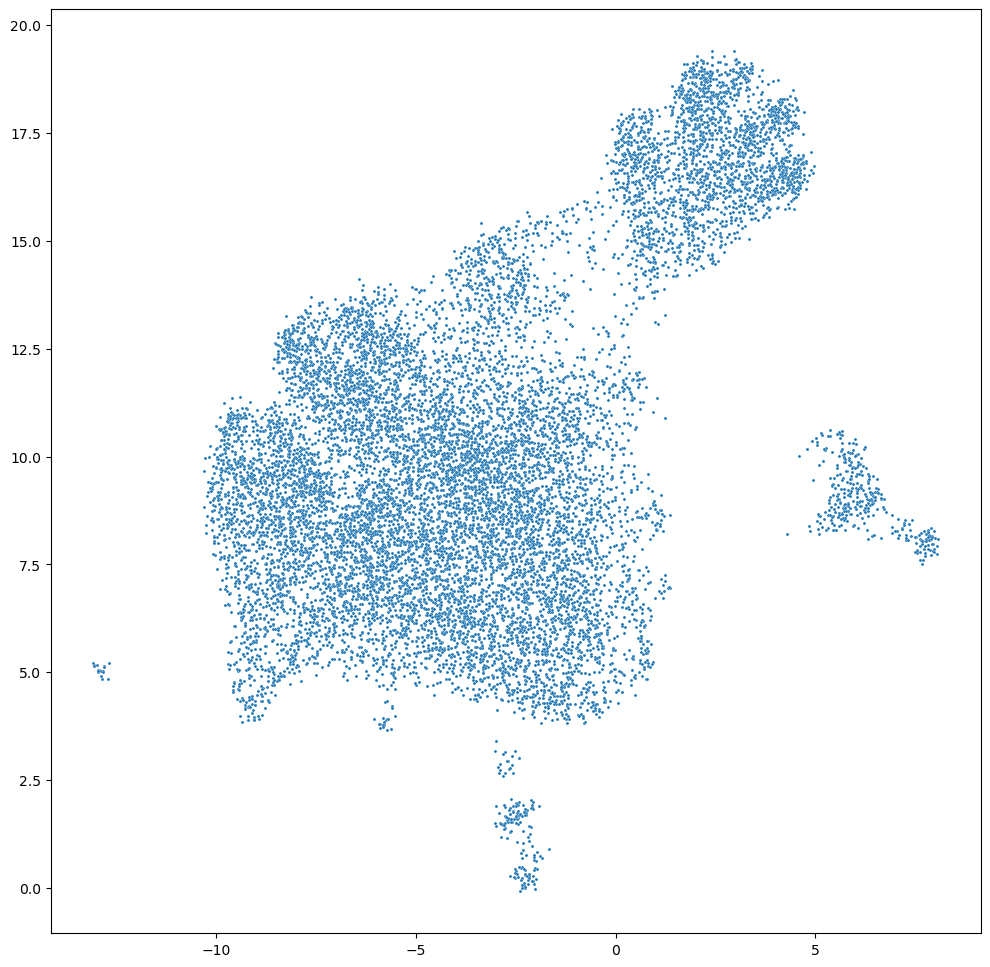

In [57]:
embedding = np.load('embedding_plot.npy')
plt.close('all')
fig, ax = plt.subplots(figsize=(12,12))
sns.scatterplot(x=embedding[:,0],y=embedding[:,1],s=5,alpha=1)
plt.show()

This UMAP visualization suggests the following:

* **Two major groups are visible.**

  * A **large cluster** on the left contains the majority of Airbnb listings.
  * A **smaller, well-separated cluster** on the top-right represents a distinct group of listings with different characteristics.

* **The top-right cluster is compact and dense.**

  * Listings within this group are highly similar to one another.
  * Their clear separation indicates they are quite different from the main population.

* **The left cluster is much more dispersed.**

  * It likely contains several **subgroups** rather than a single homogeneous cluster.
  * A clustering algorithm such as K-Means may further divide this region into multiple clusters.

* **Small isolated islands are present.**

  * These may represent **rare listing types**, niche properties, or potential outliers.

* **A thin bridge connects some regions.**

  * This indicates a gradual transition between groups rather than a sharp boundary for some listings.

* **The clusters are not perfectly spherical.**

  * This suggests the data has a complex structure, which UMAP preserves well.

### Overall Insight

The preprocessed Airbnb dataset exhibits **clear natural clustering**, indicating that clustering algorithms (e.g., K-Means or DBSCAN) are likely to identify meaningful groups of similar listings. The large left cluster may require multiple clusters, while the compact top-right cluster already appears to represent a distinct segment.


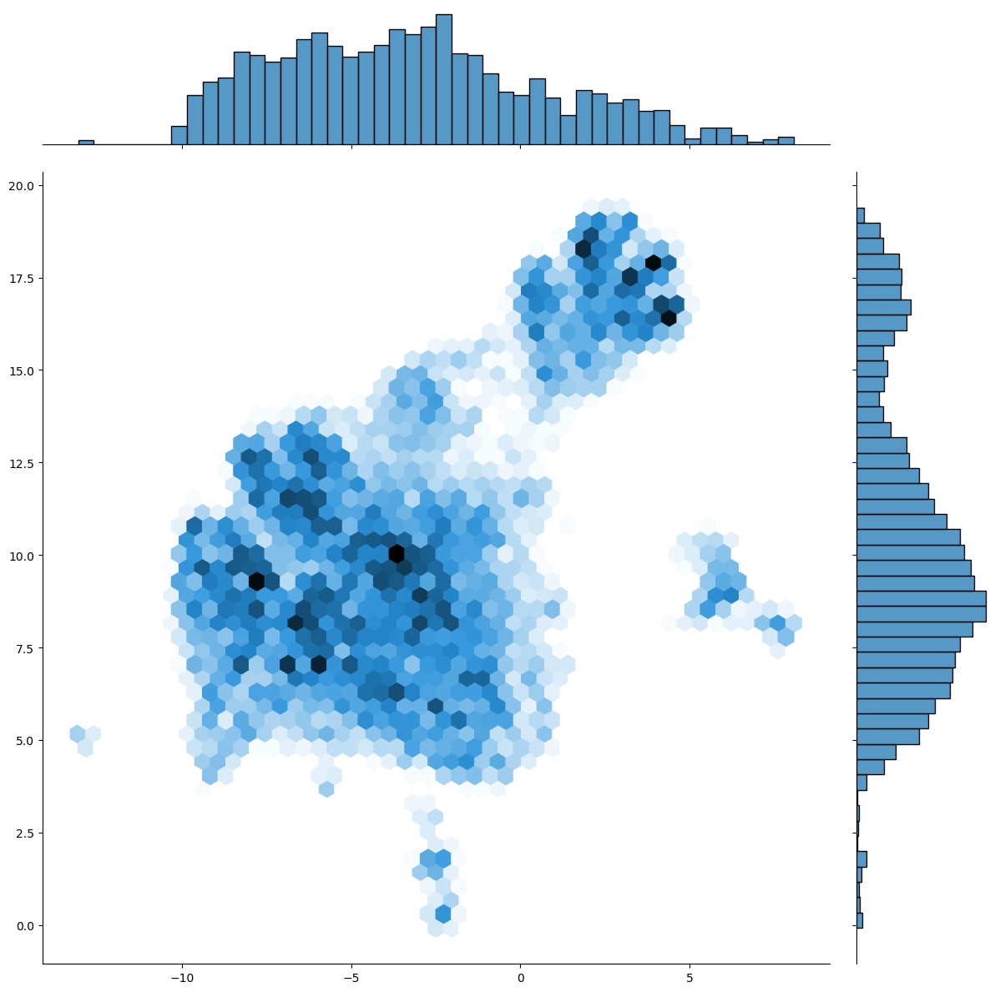

In [58]:
sns.jointplot(x=embedding[:,0],y=embedding[:,1],kind='hex',height=12)
plt.show()

This hexbin plot highlights the **density** of Airbnb listings in the UMAP embedding. Darker hexagons indicate regions with more listings.

### Insights

* **Two major clusters are clearly visible.**

  * A **large, dense cluster** on the left contains the majority of listings.
  * A **smaller but compact cluster** on the top-right is well separated, suggesting a distinct category of listings.

* **The left cluster has the highest density.**

  * The darkest hexagons are concentrated near the center of this cluster.
  * This indicates that most Airbnb listings share similar characteristics and belong to this common group.

* **The top-right cluster is compact and dense.**

  * Listings within this region are highly similar to one another.
  * Its clear separation suggests it represents a different segment of Airbnb properties.

* **Several low-density subclusters exist.**

  * Small groups below and between the main clusters likely represent rare listing types or niche property categories.

* **A thin bridge connects the two main regions.**

  * This indicates some listings have characteristics that lie between the two major groups, showing a gradual transition rather than a sharp boundary.

* **Very few outliers are present.**

  * Only a handful of isolated hexagons appear far from the dense regions, indicating that extreme or unusual listings are uncommon.

### Overall Conclusion

The preprocessed Airbnb dataset exhibits **strong natural grouping**, with one dominant cluster, one clearly distinct secondary cluster, and a few smaller subgroups. This suggests that clustering algorithms such as **K-Means** or **DBSCAN** are likely to identify meaningful customer or property segments.


The **darker the color, the more data points (Airbnb listings) are concentrated in that area.**

Specifically:

* **Very dark (almost black)** → Highest density (many listings overlap in that region).
* **Dark blue** → High density.
* **Light blue** → Moderate density.
* **Very light blue** → Few listings.

Think of each hexagon as a **bucket**:

```text
Hexagon 1 → 5 listings  → Light blue
Hexagon 2 → 30 listings → Dark blue
Hexagon 3 → 80 listings → Almost black
```

### In your plot:

* The **darkest regions** in the left cluster indicate that **most Airbnb listings are concentrated there**, meaning many listings have very similar characteristics.
* The **dark hexagons** in the top-right cluster show another dense group of similar listings.
* The **light-colored hexagons** around the edges represent fewer listings, indicating less common property types or transition regions between clusters.

**In one line:** **Darker color = higher concentration (higher density) of Airbnb listings in that region.**

The **top histogram** shows the distribution (frequency) of the **UMAP X-axis values**, and the **right histogram** shows the distribution of the **UMAP Y-axis values**—i.e., how many Airbnb listings fall at different positions along each UMAP dimension.



### Finding N-Clusters

In [59]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score

In [60]:
# # stores predicted clustering results
# results=[]
# kmeans_predictions = []

# # iterates for a clustering range of k = 2 to 40
# for k in range(2, 41):
#     kmeans = MiniBatchKMeans(n_clusters=k).fit(sd_pp)
#     predict = kmeans.predict(sd_pp)
#     result = {
#         'k':k,
#         'inertia': kmeans.inertia_,                      # get inertia score for each iteration of k
#         'silhouette': silhouette_score(sd_pp, predict),  # get silhouette score
#     }
#     results.append(result)
#     kmeans_predictions.append(predict)
#     print(result, end='\r')
    
# cluster_results = pd.DataFrame(results)

In [61]:
#cluster_results.to_csv('cluster_results')

In [62]:
cluster_results = pd.read_csv('cluster_results', index_col= 0)


In [63]:
cluster_results

,k,inertia,sihouette
0,2,443901.514744,0.396385
1,3,398460.791426,0.159553
2,4,364314.144315,0.164912
3,5,352297.639070,0.110072
4,6,351926.215248,0.103203
5,7,331702.724558,0.165165
6,8,308013.358600,0.091024
7,9,303679.339458,0.085530
8,10,290637.363362,0.102106
9,11,290405.001639,0.075289


K = 5 was chosen because the inertia curve reaches its elbow at 5—after this point, adding more clusters produces only marginal reductions in inertia, while five clusters provide more meaningful segmentation than just two, despite the silhouette score being lower.
Why is clusters = 5?

the elbow point, where adding more clusters does not significantly reduce inertia.Because we first plotted inertia for different values of K (2–40) and looked for the elbow point.

As K increases, inertia always decreases.
Initially, inertia drops sharply.
After a certain K, the decrease becomes much smaller.
That point is called the elbow.

If the elbow occurs around K = 5, then we choose:

clusters = 5

because:

Fewer than 5 clusters: groups are too broad.
More than 5 clusters: only a small improvement in inertia while increasing model complexity.

So 5 is chosen as the best trade-off between simplicity and clustering quality.

In one line: We set clusters = 5 because the elbow plot shows that after 5 clusters, the reduction in inertia becomes much smaller, indicating that additional clusters provide diminishing returns.

## Plot Inertia

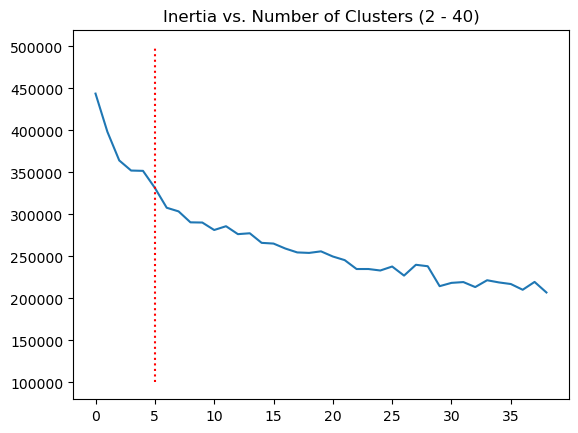

In [64]:
clusters = 5
fig, ax = plt.subplots()
ax.set_title('Inertia vs. Number of Clusters (2 - 40)')
cluster_results.inertia.plot(ax=ax)
ax.vlines(x=clusters, ymin=100000, ymax=500000, colors='red', linestyles='dotted')
plt.show()

### Plot Silohouette Score

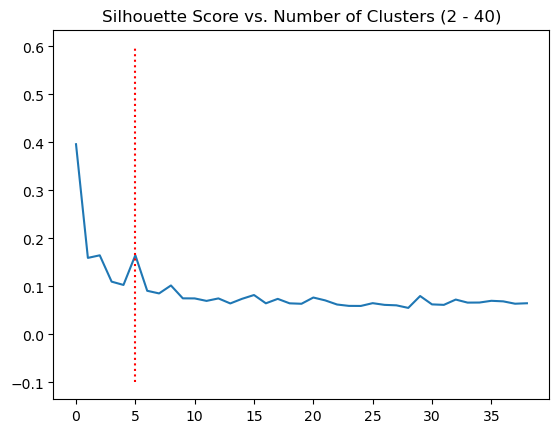

In [65]:
plt.close('all')
fig, ax = plt.subplots()
ax.set_title('Silhouette Score vs. Number of Clusters (2 - 40)')
cluster_results.sihouette.plot()
ax.vlines(x=clusters, ymin=-.1, ymax=.6, colors='red', linestyles='dotted')
plt.show()

Why plot the silhouette score if K = 5 wasn't chosen by it?

The silhouette plot is used to validate the chosen K, not necessarily to select it.

In your data:

K = 2 has the highest silhouette score (0.396), but it creates only 2 broad clusters.
K = 5 has a lower silhouette score (0.110), but the elbow plot shows that 5 is a good trade-off between reducing inertia and keeping a manageable number of meaningful clusters.

So the project selected K = 5 using the elbow method and used the silhouette plot to evaluate the quality of that clustering.

If you are using only the silhouette score to choose the number of clusters, you select the K with the highest silhouette score.

Higher silhouette score = better-separated and more compact clusters.
The silhouette score ranges from -1 to 1.
Closer to 1 is better.

In your data, the maximum silhouette score is 0.396 at K = 2, so silhouette alone would choose K = 2.

The key difference is **what you're trying to measure**.

### In supervised learning

You have **labels (target values)**.

Example:

* Predict house prices.
* Train on 80% of the data.
* Test on the remaining 20%.
* Compare predictions with the **true prices**.
* Cross-validation measures prediction performance.

✅ Cross-validation works because there is a **correct answer**.

---

### In K-Means

You have **no labels**.

Example:

* You only have Airbnb listings.
* There is **no true cluster** for each listing.

If you split the data into folds:

* Train K-Means on the training fold.
* The clusters found on the test fold may have different cluster numbers or centers.
* There is **no ground truth** to calculate accuracy.

❌ So cross-validation cannot tell you whether **K = 3** is better than **K = 5**.

---

### Instead, K-Means uses internal metrics:

* **Elbow method (inertia)** → How compact are the clusters?
* **Silhouette score** → How well separated are the clusters?
* **Gap statistic** → Compares clustering to random data.



> **Cross-validation is not used for K-Means because there are no true labels to evaluate prediction accuracy; instead, K is chosen using internal clustering metrics like inertia and the silhouette score.**


In [66]:
kmeans = MiniBatchKMeans(n_clusters = clusters, random_state = 42).fit(sd_pp)
kmeans

  File "C:\Users\DELL\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "C:\Users\DELL\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\DELL\anaconda3\Lib\subprocess.py", line 1039, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
                        pass_fds, cwd, env,
                        ^^^^^^^^^^^^^^^^^^^
    ...<5 lines>...
                        gid, gids, uid, umask,
                        ^^^^^^^^^^^^^^^^^^^^^^
                        start_new_session, process_group)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\DELL\anaconda3\Lib\subprocess.py",

MiniBatchKMeans(n_clusters=5, random_state=42)

Let's break it down.

```python
pred_labels = np.unique(kmeans.predict(sd_pp))
```

### Step 1: `kmeans.predict(sd_pp)`

**What it does:**

* Assigns **every data point** in `sd_pp` to its **nearest cluster**.

Example:

```python
kmeans.predict(sd_pp)
```

might return

```python
[0, 1, 2, 0, 4, 3, 2, 1, 4, 0, ...]
```

Each number is the cluster label for one row.

---

### Step 2: `np.unique(...)`

**What it does:**

* Removes duplicate labels and returns only the unique cluster numbers.

Example:

```python
np.unique([0,1,2,0,4,3,2,1,4,0])
```

returns

```python
array([0,1,2,3,4])
```

---

### Why do we do this?

To find **which cluster labels exist** in the fitted model.

If `clusters = 5`, the expected output is:

```python
array([0,1,2,3,4])
```

These are the five cluster IDs.

---

### Why use `MiniBatchKMeans`?

`MiniBatchKMeans` works exactly like K-Means but is **much faster for large datasets**.

Instead of using **all data points** to update cluster centers in each iteration, it uses **small random batches** of data.

**Advantages:**

* Faster training.
* Uses less memory.
* Produces cluster assignments with `predict()` just like standard `KMeans`.

So `kmeans.predict(sd_pp)` works the same whether `kmeans` is a `KMeans` or a `MiniBatchKMeans` model.


In [67]:
#Labels for each cluster
pred_labels = np.unique(kmeans.predict(sd_pp))
pred_labels

array([0, 1, 2, 3, 4], dtype=int32)

In [68]:
# get prediction on sd_pp to get labels
sd_cluster_labels = pd.Series(kmeans.predict(sd_pp),index=sd_pp.index)
# convert predicted cluster labels to a list
cluster_list = sd_cluster_labels.values.tolist()

In [69]:
# insert cluster label to the sd_modeling df
sd_clustered = sd_modeling.copy()
sd_clustered.insert(1,'cluster_label',cluster_list)
sd_clustered.head()

,id,cluster_label,latitude,longitude,neighbourhood_cleansed,zipcode,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_time,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,33159143,1,32.91736,-117.07635,Scripps Ranch,92131,House,Private room,1,1.0,1.0,1,Real Bed,1100.0,1100.0,1000.0,0.0,1,0.0,60,90,within a few hours,100.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,strict_14_with_grace_period,0,0
1,17138468,4,32.84067,-117.27443,La Jolla,92037,Apartment,Entire home/apt,1,2.0,2.0,3,Real Bed,1400.0,1400.0,0.0,0.0,1,0.0,30,1125,no response,0.0,0,1.0,1,0,2,4,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,strict_14_with_grace_period,0,0
2,21898446,4,32.79797,-117.24250,Pacific Beach,92109,Townhouse,Private room,1,1.0,1.0,1,Real Bed,1250.0,1250.0,0.0,0.0,1,0.0,30,30,no response,0.0,0,1.0,1,0,0,0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,flexible,0,0
3,25948680,4,32.77545,-117.05923,College Area,92120,Apartment,Entire home/apt,1,1.0,1.0,1,Real Bed,1150.0,1150.0,0.0,0.0,1,0.0,31,40,no response,0.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,0,0,flexible,0,0
4,1756516,0,32.84619,-117.27558,La Jolla,92037,Condominium,Private room,1,1.0,1.0,1,Real Bed,110.0,110.0,200.0,0.0,1,50.0,180,365,within a day,67.0,0,6.0,1,1,2,4,90.0,7.0,7.0,8.0,8.0,9.0,10.0,0,0,0,strict_14_with_grace_period,0,0


In [70]:
# save as csv
#path = "data/"

sd_clustered.to_csv('sd_clustered')

In [71]:
# insert cluster label to the sd_modeling df
sd_pp_clustered = sd_pp.copy()
sd_pp_clustered.insert(0, 'cluster_label', cluster_list)

sd_pp_clustered.head()

,cluster_label,Allied Gardens,Alta Vista,Amphitheater And Water Park,Balboa Park,Bario Logan,Bay Ho,Bay Park,Bay Terrace,Bird Land,Bonita Long Canyon,Carmel Mountain,Carmel Valley,Chollas View,City Heights East,City Heights West,Clairemont Mesa,College Area,Columbia,Core,Cortez Hill,Darnall,Del Cerro,Del Mar Heights,East Lake,East Village,Eastlake Trails,Eastlake Vistas,Eastlake Woods,Egger Highlands,El Cerritos,Emerald Hills,Encanto,Estlake Greens,Gaslamp Quarter,Gateway,Grant Hill,Grantville,Horton Plaza,Jomacha-Lomita,Kearny Mesa,Kensington,La Jolla,La Jolla Village,Lake Murray,Lincoln Park,Linda Vista,Little Italy,Loma Portal,Lynwood Hills,Marina,Memorial,Midtown,Midtown District,Mira Mesa,Mission Bay,Mission Valley,Moreno Mission,Mount Hope,Mountain View,Nestor,Normal Heights,North City,North Clairemont,North Hills,Northwest,Oak Park,Ocean Beach,Old Town,Otay Ranch,Pacific Beach,Palm City,Paradise Hills,Park West,Paseo Ranchoero,Rancho Bernadino,Rancho Del Rey,Rancho Penasquitos,Rolando,Rolling Hills Ranch,Roseville,Sabre Springs,San Carlos,San Ysidro,Scripps Ranch,Serra Mesa,Sky Line,Sorrento Valley,South Park,Southcrest,Southwest,Sunbow,Talmadge,Terra Nova,Thomy Locust Pl,Tierrasanta,Tijuana River Valley,Torrey Pines,University City,Valencia Park,Webster,West University Heights,Wooded Area,Yosemite Dr,22000,22010,22425,22435,91901,91902,91910,91911,91913,91914,91915,91932,91941,91942,91945,91950,92014,92025,92029,92037,92054,92064,92071,92075,92101,92102,92103,92104,92105,92106,92107,92108,92109,92110,92111,92113,92114,92115,92116,92117,92118,92119,92120,92121,92122,92123,92124,92126,92127,92128,92129,92130,92131,92139,92154,92173,92307,92618,921096,Aparthotel,Apartment,Barn,Bed and breakfast,Boat,Boutique hotel,Bungalow,Bus,Cabin,Camper/RV,Campsite,Casa particular (Cuba),Castle,Cave,Chalet,Condominium,Cottage,Dome house,Earth house,Farm stay,Guest suite,Guesthouse,Hostel,Hotel,House,Igloo,Loft,Nature lodge,Other,Resort,Serviced apartment,Tent,Tiny house,Townhouse,Treehouse,Vacation home,Villa,Entire home/apt,Private room,Shared room,Airbed,Couch,Futon,Pull-out Sofa,Real Bed,host_response_time,cancellation_policy,accommodates,bathrooms,bedrooms,beds,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,require_guest_profile_picture,require_guest_phone_verification
0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0,-1.152178,-0.561234,-0.533910,-0.728205,2.546221,0.605242,1.504821,-0.909452,-0.563027,-0.490463,3.516095,-0.408407,0.513198,-0.764114,-0.238612,0.038199,-0.972913,-0.581096,-0.581096,0.372801,0.36845,0.464503,0.272007,0.278657,0.342548,0.598151,0.0,0.970377,0.0,-0.167773,-0.183102
1,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

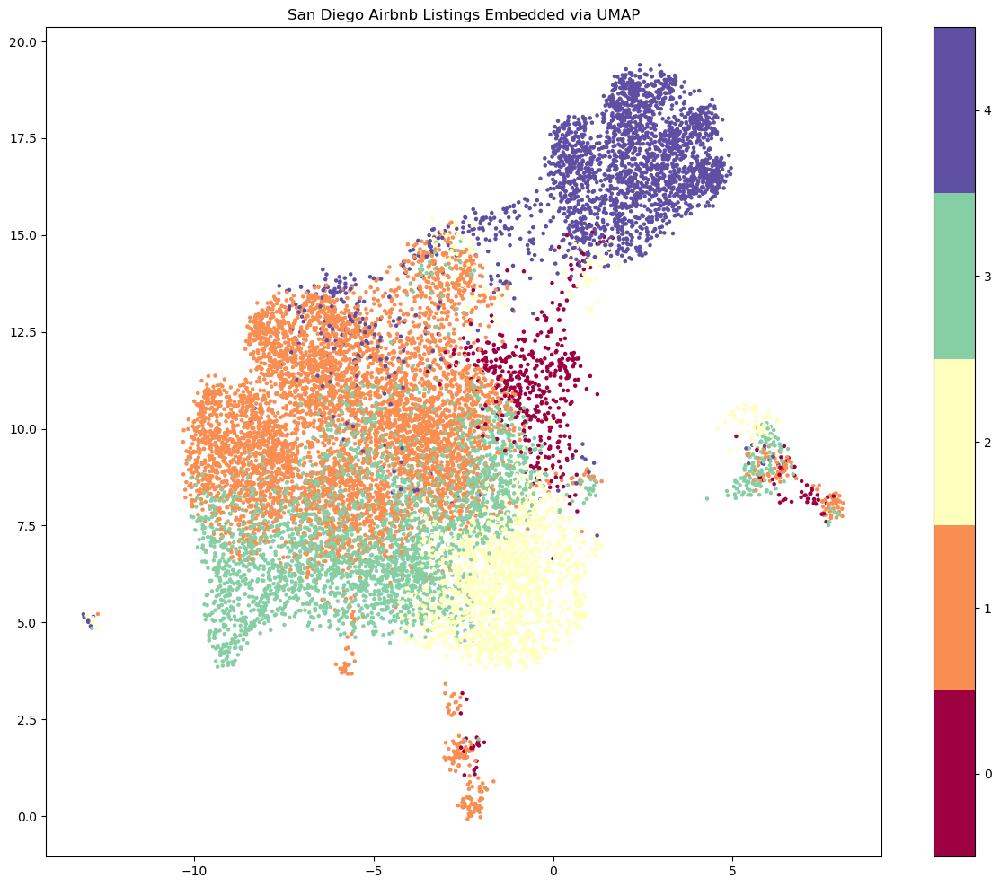

In [72]:
# plot  clusters with UMAP 
fig, ax = plt.subplots(figsize = (15,12))

plt.scatter(embedding[:,0], embedding[:,1], s = 5, alpha = 1, c = kmeans.predict(sd_pp), cmap = 'Spectral')

labels = sorted(list(sd_cluster_labels.unique())) # cluster labels

cbar = plt.colorbar(boundaries=np.arange(6)-0.5) # 6 cluster labels
cbar.set_ticks(np.arange(5))
cbar.set_ticklabels(labels)
plt.title('San Diego Airbnb Listings Embedded via UMAP');

plt.show()

This code visualizes the 6 KMeans clusters on the 2D UMAP embedding, where each point is an Airbnb listing and its color represents the cluster assigned by MiniBatch KMeans.

From the UMAP visualization, these are the main insights:

1. **Five major color regions (clusters) are visible**

   * The data is divided into **5 distinct groups (labels 0–4)**, indicating that MiniBatch KMeans has found meaningful segments in the Airbnb listings.

2. **The top-right island is almost entirely Cluster 4 (purple)**

   * This cluster is well separated from the rest, suggesting listings in this group have very different characteristics from other Airbnb listings.

3. **The large left-side region contains multiple clusters**

   * Clusters 0 (red), 1 (orange), 2 (yellow), and 3 (green) overlap considerably.
   * This indicates these listings are more similar to one another, making the cluster boundaries less distinct.

4. **Cluster 1 (orange) is the largest cluster**

   * It covers a large portion of the left side, meaning many listings share similar feature patterns.

5. **Cluster 0 (red) is concentrated mainly in the lower-left**

   * It occupies a relatively compact area, suggesting a smaller but well-defined segment.

6. **Cluster 2 (yellow) lies mostly in the lower-middle**

   * It forms a transition between the orange and green clusters, indicating moderate similarity to both.

7. **Cluster 3 (green) occupies the central region**

   * It overlaps with neighboring clusters, implying its listings are not drastically different from clusters 1 and 2.

8. **Small isolated islands are present**

   * Tiny groups around the bottom and center-right likely represent niche subsets or outlier listings with unique characteristics.

9. **UMAP preserves neighborhood structure**

   * Nearby points correspond to listings with similar features, while distant groups (like the top-right island) represent listings that are much less similar.

### Overall conclusion

The visualization shows that the Airbnb dataset naturally separates into **one highly distinct cluster (Cluster 4)** and **four more closely related clusters (Clusters 0–3)**. This suggests there is one unique segment of listings, while the remaining listings differ more gradually from each other.


Clustering is important in recommendation systems because it **groups similar users or similar items together**, making recommendations faster and more relevant.

### Why clustering is useful

1. **Groups similar users**

   * Users with similar preferences are placed in the same cluster.
   * Example: Users who frequently book beachfront Airbnb listings can be grouped together.

2. **Groups similar items**

   * Similar products or listings are clustered.
   * Example: Luxury villas, budget apartments, and family homes become separate clusters.

3. **Improves recommendation quality**

   * Instead of searching the entire dataset, the system recommends items from the user's cluster, increasing relevance.

4. **Reduces computation**

   * Searching within one cluster is much faster than comparing against millions of items.

5. **Helps with new users (Cold Start)**

   * If a new user has limited history, they can be assigned to the closest cluster based on a few preferences, and recommendations can start immediately.

### Airbnb example

Suppose KMeans creates these clusters:

* **Cluster 0:** Budget shared rooms
* **Cluster 1:** Family homes
* **Cluster 2:** Downtown apartments
* **Cluster 3:** Beachfront properties
* **Cluster 4:** Luxury villas

If a user books and likes **luxury villas**, the recommendation system mainly suggests **other listings from Cluster 4** instead of searching all Airbnb listings.

### In one line (interview answer)

**Clustering improves recommendation systems by grouping similar users or items, enabling faster, more personalized, and computationally efficient recommendations.**


### Understanding the Cluster Labels with Bokeh
While we have identified 6 clustered groups/labels, it is still difficult to understand what seperates each individual group from another. I'll now construct an interactive bokeh scatterplot which will assign labels to each point and we'll try to find similarities amongst the clusters.

Why is this useful?

Clustering tells us which songs are similar, but the Bokeh visualization helps us understand what makes them similar. This makes it easier to interpret the clusters and later use them in a recommendation system.

In one line:
Bokeh is used to interactively visualize clustered songs so we can inspect each cluster and understand the common characteristics of the songs within it.


In [73]:
from bokeh.resources import INLINE
from bokeh.plotting import figure, show
from bokeh.transform import factor_cmap

import bokeh.io

import umap.plot

bokeh.io.output_notebook(INLINE)

Loading BokehJS ...

In [86]:
#embedding_map = umap.UMAP(n_neighbors=500, min_dist= .9, random_state=42).fit(sd_pp)

```python
embedding_map = umap.UMAP(
    n_neighbors=500,
    min_dist=0.9,
    random_state=42
).fit(sd_pp)
```

### What are we doing?

We are **training a UMAP model** on the preprocessed Airbnb dataset (`sd_pp`) to reduce its dimensions while preserving the data structure for visualization.

### Why `n_neighbors=500`?

`n_neighbors` tells UMAP **how many nearby data points to consider** when placing each point.

* **Small value (e.g., 15):** Focuses on **local structure** (small groups/clusters).
* **Large value (e.g., 500):** Focuses on the **global structure** of the entire dataset.

They chose **500** because the goal is to create a **high-level visualization** where similar Airbnb listings form broad, meaningful clusters instead of many tiny scattered groups.

### Why `min_dist=0.9`?

A high `min_dist` spreads points farther apart, making the visualization less crowded and easier to interpret.

### Why `random_state=42`?

Ensures the UMAP embedding is **reproducible**—you get the same result every time you run the code.

### In one line:

**`n_neighbors=500` is used so UMAP preserves the overall (global) structure of the Airbnb listings rather than focusing only on small local neighborhoods.**


In [75]:
# Save embedding
#np.save("embedding_plot.npy", embedding_map.embedding_)

# Load embedding
embedding = np.load("embedding_plot.npy")

In [76]:
sd_pp_clustered.head(1)

,cluster_label,Allied Gardens,Alta Vista,Amphitheater And Water Park,Balboa Park,Bario Logan,Bay Ho,Bay Park,Bay Terrace,Bird Land,Bonita Long Canyon,Carmel Mountain,Carmel Valley,Chollas View,City Heights East,City Heights West,Clairemont Mesa,College Area,Columbia,Core,Cortez Hill,Darnall,Del Cerro,Del Mar Heights,East Lake,East Village,Eastlake Trails,Eastlake Vistas,Eastlake Woods,Egger Highlands,El Cerritos,Emerald Hills,Encanto,Estlake Greens,Gaslamp Quarter,Gateway,Grant Hill,Grantville,Horton Plaza,Jomacha-Lomita,Kearny Mesa,Kensington,La Jolla,La Jolla Village,Lake Murray,Lincoln Park,Linda Vista,Little Italy,Loma Portal,Lynwood Hills,Marina,Memorial,Midtown,Midtown District,Mira Mesa,Mission Bay,Mission Valley,Moreno Mission,Mount Hope,Mountain View,Nestor,Normal Heights,North City,North Clairemont,North Hills,Northwest,Oak Park,Ocean Beach,Old Town,Otay Ranch,Pacific Beach,Palm City,Paradise Hills,Park West,Paseo Ranchoero,Rancho Bernadino,Rancho Del Rey,Rancho Penasquitos,Rolando,Rolling Hills Ranch,Roseville,Sabre Springs,San Carlos,San Ysidro,Scripps Ranch,Serra Mesa,Sky Line,Sorrento Valley,South Park,Southcrest,Southwest,Sunbow,Talmadge,Terra Nova,Thomy Locust Pl,Tierrasanta,Tijuana River Valley,Torrey Pines,University City,Valencia Park,Webster,West University Heights,Wooded Area,Yosemite Dr,22000,22010,22425,22435,91901,91902,91910,91911,91913,91914,91915,91932,91941,91942,91945,91950,92014,92025,92029,92037,92054,92064,92071,92075,92101,92102,92103,92104,92105,92106,92107,92108,92109,92110,92111,92113,92114,92115,92116,92117,92118,92119,92120,92121,92122,92123,92124,92126,92127,92128,92129,92130,92131,92139,92154,92173,92307,92618,921096,Aparthotel,Apartment,Barn,Bed and breakfast,Boat,Boutique hotel,Bungalow,Bus,Cabin,Camper/RV,Campsite,Casa particular (Cuba),Castle,Cave,Chalet,Condominium,Cottage,Dome house,Earth house,Farm stay,Guest suite,Guesthouse,Hostel,Hotel,House,Igloo,Loft,Nature lodge,Other,Resort,Serviced apartment,Tent,Tiny house,Townhouse,Treehouse,Vacation home,Villa,Entire home/apt,Private room,Shared room,Airbed,Couch,Futon,Pull-out Sofa,Real Bed,host_response_time,cancellation_policy,accommodates,bathrooms,bedrooms,beds,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,require_guest_profile_picture,require_guest_phone_verification
0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0,-1.152178,-0.561234,-0.53391,-0.728205,2.546221,0.605242,1.504821,-0.909452,-0.563027,-0.490463,3.516095,-0.408407,0.513198,-0.764114,-0.238612,0.038199,-0.972913,-0.581096,-0.581096,0.372801,0.36845,0.464503,0.272007,0.278657,0.342548,0.598151,0.0,0.970377,0.0,-0.167773,-0.183102


### Reverse OHE
In order to make the interactive bokeh plot below more interpretable, I'll need to reverse encode the sd_pp_clustered dataframe so that it assigns labels to each individual point in the plot.
Thus, I'll need to format sd_pp_clustered to look like the original column format in sd_trans as shown below:

In [77]:
sd_trans.head(1)

,neighbourhood_cleansed,zipcode,property_type,room_type,bed_type,host_response_time,cancellation_policy,accommodates,bathrooms,bedrooms,beds,nightly_price,price_per_stay,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,number_of_reviews,number_of_stays,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,require_guest_profile_picture,require_guest_phone_verification
0,Scripps Ranch,92131,House,Private room,Real Bed,within a few hours,strict_14_with_grace_period,1,1.0,1.0,1,1100.0,1100.0,1000.0,0.0,1,0.0,60,90,100.0,0,1.0,1,0,0,0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,0,0,0


In [79]:
#assign cluster labels
cluster_df = pd.DataFrame(sd_pp_clustered['cluster_label'])

#assign neighborhood
neighborhood_df = pd.DataFrame(sd_pp_clustered.loc[:,'Allied Gardens':'Yosemite Dr'].idxmax(axis=1)).rename(columns={0:'Neighborhood'})

# assigns property type
property_df = pd.DataFrame(sd_pp_clustered.loc[:,'Aparthotel':'Villa'].idxmax(axis = 1)).rename(columns = {0:'Property'})

# assigns room type
room_df = pd.DataFrame(sd_pp_clustered.loc[:,'Entire home/apt':'Shared room'].idxmax(axis = 1)).rename(columns = {0:'Room Type'})

# assigns price
price = pd.DataFrame('$' + sd_trans['price_per_stay'].astype(str))

# assigns rating
rating = pd.DataFrame(sd_trans['review_scores_rating'].astype(int))


# concat all the dfs
cluster_hover_data = pd.concat([cluster_df, price, rating, neighborhood_df, property_df, room_df], axis = 1)

cluster_hover_data

,cluster_label,price_per_stay,review_scores_rating,Neighborhood,Property,Room Type
0,1,$1100.0,98,Scripps Ranch,House,Private room
1,4,$1400.0,100,La Jolla,Apartment,Entire home/apt
2,4,$1250.0,97,Pacific Beach,Townhouse,Private room
3,4,$1150.0,98,College Area,Apartment,Entire home/apt
4,0,$110.0,90,La Jolla,Condominium,Private room
...,...,...,...,...,...,...
13035,2,$3000.0,96,Mission Bay,Villa,Entire home/apt
13036,2,$2823.0,83,La Jolla,House,Entire home/apt
13037,2,$208.0,92,Mission Bay,House,Entire home/apt
13038,2,$1305.0,80,La Jolla,House,Entire home/apt


In [81]:
embedding

array([[-3.4573915 , 11.951942  ],
       [ 0.9592987 , 16.232708  ],
       [ 2.2897239 , 17.235703  ],
       ...,
       [-1.0067077 ,  6.283065  ],
       [ 0.45592648,  4.8997455 ],
       [ 0.06462651,  4.582717  ]], dtype=float32)

In [82]:
kmeans.predict(sd_pp)

array([1, 4, 4, ..., 2, 2, 2], dtype=int32)

### Plot Interactive Bokeh Scatterplot with Labels for each Airbnb Listing

In [87]:
#p = umap.plot.interactive(embedding, 
                          #labels = kmeans.predict(sd_pp), # color codes the clusters
                          #point_size=5, alpha = 0.3,
                          #hover_data=cluster_hover_data, # get cluster labels
                          #width = 800, height = 800)
#umap.plot.show(p)

In [88]:
# cleaning up columns to plot 
cluster_hover_data['price_per_stay'] = cluster_hover_data['price_per_stay'].str.replace('$', '')
cluster_hover_data['price_per_stay'] = cluster_hover_data['price_per_stay'].astype(float)
cluster_hover_data['cluster_label'] = cluster_hover_data['cluster_label'].astype('category')
cluster_hover_data

,cluster_label,price_per_stay,review_scores_rating,Neighborhood,Property,Room Type
0,1,1100.0,98,Scripps Ranch,House,Private room
1,4,1400.0,100,La Jolla,Apartment,Entire home/apt
2,4,1250.0,97,Pacific Beach,Townhouse,Private room
3,4,1150.0,98,College Area,Apartment,Entire home/apt
4,0,110.0,90,La Jolla,Condominium,Private room
...,...,...,...,...,...,...
13035,2,3000.0,96,Mission Bay,Villa,Entire home/apt
13036,2,2823.0,83,La Jolla,House,Entire home/apt
13037,2,208.0,92,Mission Bay,House,Entire home/apt
13038,2,1305.0,80,La Jolla,House,Entire home/apt


In [89]:
# save as csv
#path = "data/"

cluster_hover_data.to_csv('cluster_hover_data')

#### Distribution of Clusters
Let's first take a look at the distribution of each cluster group.

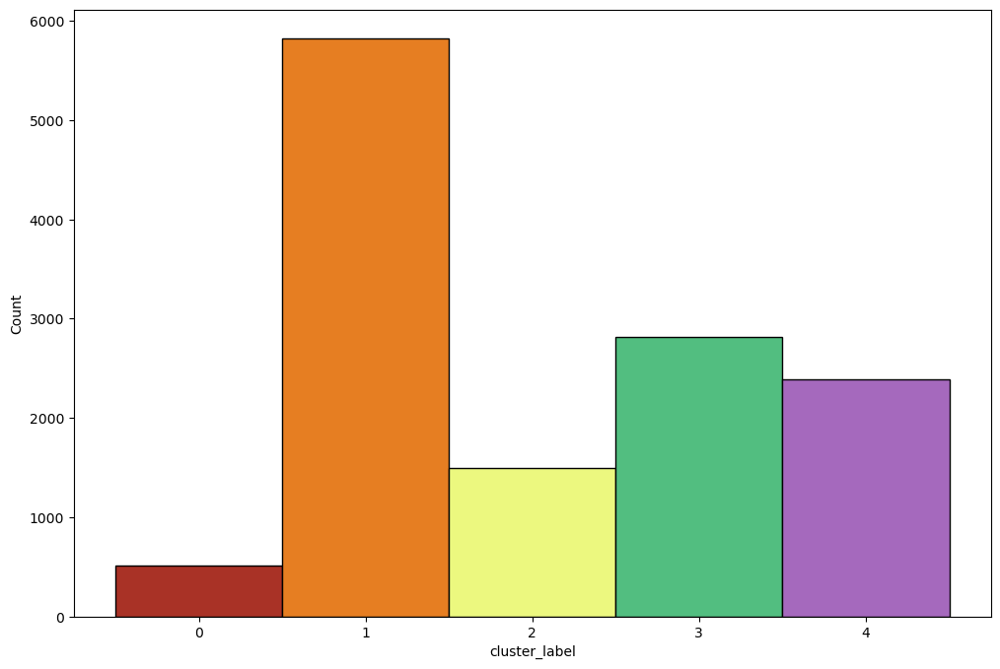

In [90]:
fig, axes = plt.subplots(figsize=(12,8))

ax = sns.histplot(cluster_hover_data['cluster_label'])

# set bar colors
ax.patches[0].set_facecolor('#A93226')
ax.patches[1].set_facecolor('#E67E22')
ax.patches[2].set_facecolor('#ECF87F')
ax.patches[3].set_facecolor('#52BE80')
ax.patches[4].set_facecolor('#A569BD')

plt.show()

Cluster 1 has the largest number of listings (around 5,800), so it is the dominant group in the dataset.
Cluster 3 is the second largest (around 2,800 listings).
Cluster 4 also contains a significant number of listings (around 2,400).
Cluster 2 is comparatively smaller (around 1,500 listings).
Cluster 0 has the fewest listings (around 500), indicating it represents a rare type of property.

In [93]:
# assigning colors to each label
palette = {0: '#A93226', 1:'#E67E22', 2:'#ECF87F', 3:'#52BE80', 4:'#A569BD'}

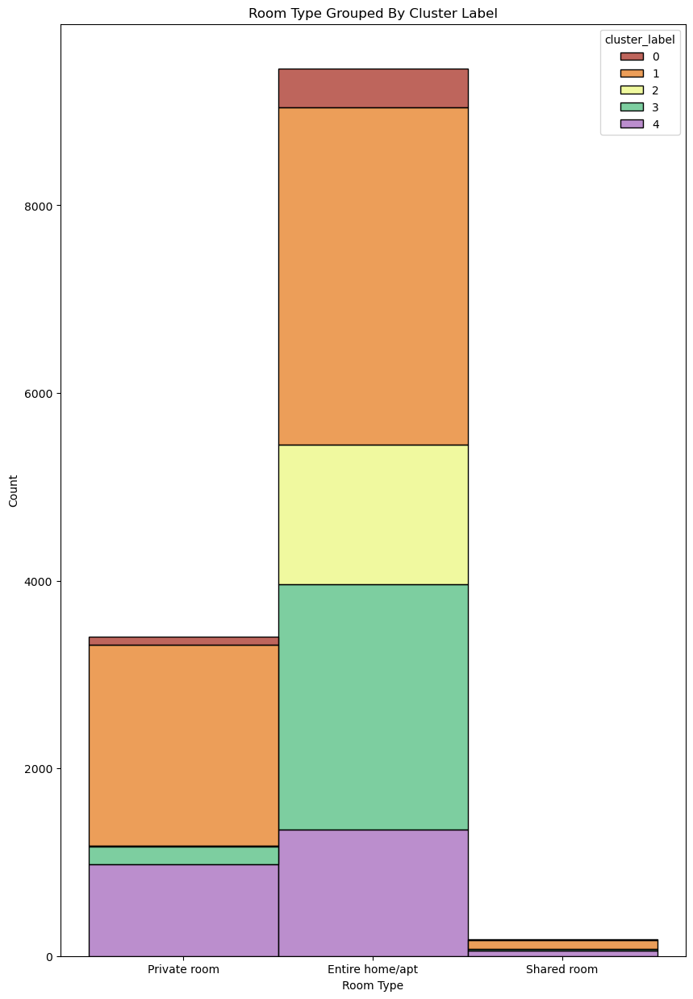

In [94]:
fig, axes = plt.subplots(figsize=(10,15))

ax = sns.histplot(data=cluster_hover_data, 
             x='Room Type', 
             hue='cluster_label', palette = palette,
             multiple="stack").set(title='Room Type Grouped By Cluster Label')

plt.show()



* **Entire home/apartment** is the **most common room type** across all clusters, indicating most Airbnb listings offer an entire property.
* **Private rooms** are the **second most common**, with a noticeable presence in multiple clusters.
* **Shared rooms** are **very rare** in every cluster, suggesting low availability and demand.
* The distribution of room types varies by cluster, showing that **each cluster captures different property characteristics**.
* Overall, the dataset is **dominated by entire homes/apartments**, making them the primary listing type used for clustering.


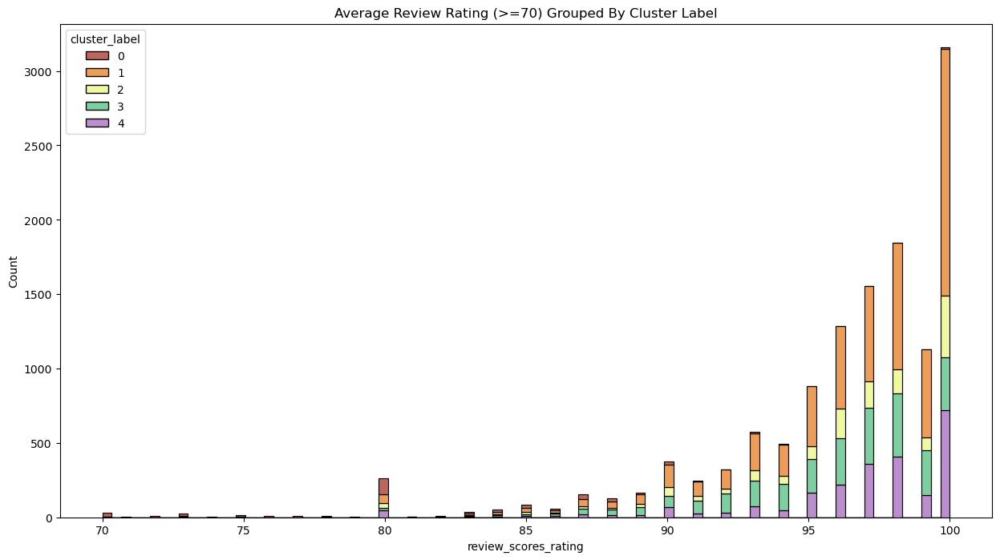

In [95]:
fig , axes = plt.subplots(figsize=(15,8))
#create filter of greater than 70 rating to remove outliers
greater_than_70 = cluster_hover_data[cluster_hover_data["review_scores_rating"]>=70]
ax = sns.histplot(data=greater_than_70, 
             x='review_scores_rating', 
             hue='cluster_label', palette = palette,
             multiple="stack").set(title='Average Review Rating (>=70) Grouped By Cluster Label')

plt.show()

### Insights from the histogram

* **Most listings have very high review ratings (95–100)**, indicating that Airbnb properties generally receive excellent guest feedback.
* **Rating 100 has the highest number of listings**, making it the most common review score across all clusters.
* **Cluster 1 (orange)** contributes the largest share of highly rated listings, which is expected since it is also the largest cluster.
* **Clusters 3 and 4** also contain many highly rated listings but fewer than Cluster 1.
* **Very few listings have ratings between 70 and 85**, showing that low-rated properties are uncommon.

### Why is `>= 70` used as the threshold?

The threshold is mainly used to **remove outliers and focus on meaningful review scores**.

* Airbnb review ratings range from **0 to 100**.
* Listings with ratings **below 70** are **very rare** and may represent:

  * new listings with very few reviews,
  * poorly rated properties,
  * data anomalies or outliers.
* Including these low ratings would stretch the x-axis and make the distribution of the majority of listings (which are rated **90–100**) harder to interpret.

So the code:

```python
greater_than_70 = cluster_hover_data[
    cluster_hover_data["review_scores_rating"] >= 70
]
```

filters out the small number of low-rated listings, making the histogram clearer and easier to analyze.



#### Price Per Stay
Lets now plot the average price per stay of each cluster label. Since there are so many outliers, we will limit the results to listings less than $1,000.

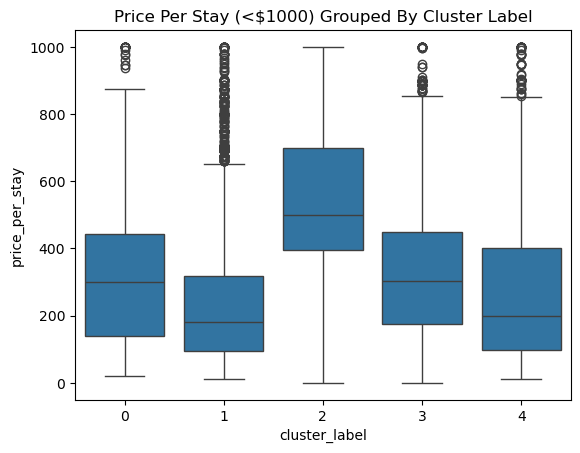

In [102]:
fig, axes = plt.subplots(figsize=(12,8))
plt.close("all")
# create a filter of less than $1000 for price per stay to remove outliers
less_than_1000 = cluster_hover_data[cluster_hover_data['price_per_stay'] <= 1000]

sns.boxplot(x = less_than_1000['cluster_label'], 
            y = less_than_1000['price_per_stay']).set(title='Price Per Stay (<$1000) Grouped By Cluster Label')

plt.show()

### Cluster-wise insights (Price per Stay)

* **Cluster 0:** **Moderately priced** listings with a median around **$300** and moderate variation.
* **Cluster 1:** **Lowest-priced** cluster (median around **$180**), though a few expensive outliers exist.
* **Cluster 2:** **Most expensive** cluster (median around **$500**) with the highest overall prices.
* **Cluster 3:** **Mid-priced** cluster (median around **$300**) with a wide spread in prices.
* **Cluster 4:** **Low to moderate-priced** cluster (median around **$200**) with several high-price outliers.

### Overall

* **Cluster 2** contains the **premium/high-cost** listings.
* **Clusters 1 and 4** are the **most affordable**.
* **Clusters 0 and 3** represent **mid-range** priced listings.


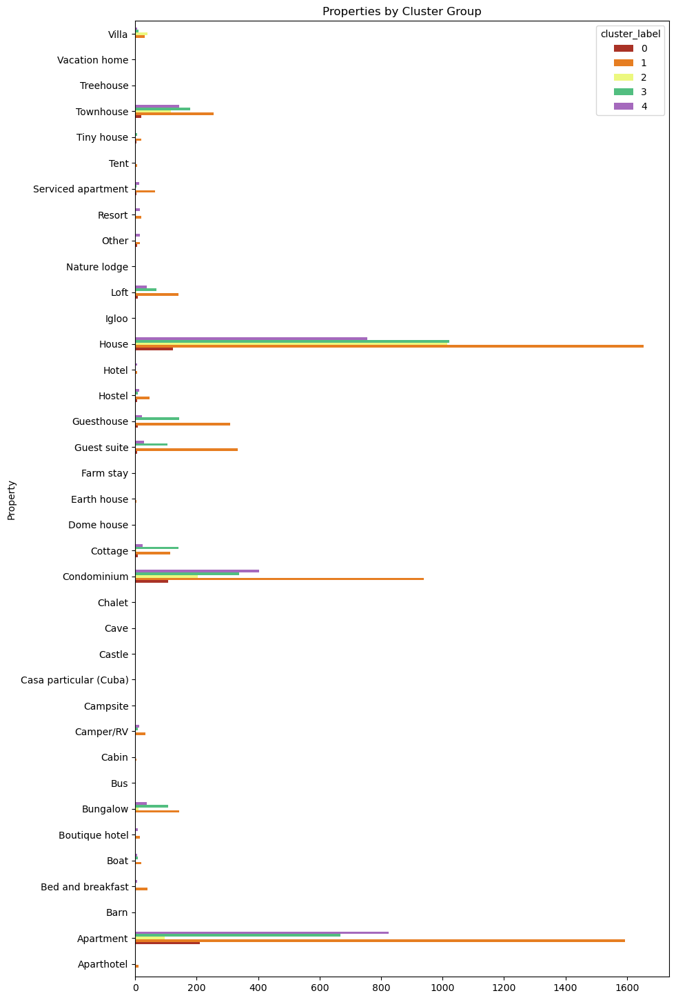

In [103]:
cluster_hover_data.groupby(['Property','cluster_label']).size().unstack(fill_value=0).plot.barh(figsize=(10,18),color=palette)
plt.title('Properties by Cluster Group')
plt.show()


### Overall Insights

* **Apartments and Houses** are the **most common property types** across all clusters.
* **Cluster 1** contains the **highest number of listings** for almost every major property type, making it the dominant cluster.
* **Condominiums** are also popular, especially in **Cluster 1**.
* Property types such as **Igloo, Castle, Cave, Dome house, Earth house, Bus, Boat, Camper/RV, Tent, and Treehouse** are **very rare**, indicating they form only a tiny fraction of Airbnb listings.
* The clusters mainly differ in the **number of listings** rather than the types of properties, with **Apartments, Houses, and Condominiums** dominating all clusters.


Based on **your plots** (cluster sizes, room types, review ratings, price per stay, and property types), your conclusions are slightly different from the GitHub version.

### Overall Conclusions About the Clusters

**Cluster 0 – Mid-priced standard listings**

* Moderately priced listings with good review ratings.
* Mainly consists of **entire homes/apartments** and **houses/apartments**.
* Represents standard Airbnb accommodations with average popularity.

**Cluster 1 – Most popular and affordable listings**

* Largest cluster with the highest number of listings.
* Mostly **highly rated (95–100)** and relatively **low-priced**.
* Dominated by **houses, apartments, and private rooms**, making it suitable for budget-conscious travelers.

**Cluster 2 – Premium listings**

* Highest median **price per stay**, indicating premium or luxury properties.
* Mostly **entire homes/apartments** with excellent review ratings.
* Represents high-end accommodations.

**Cluster 3 – Moderately priced, well-rated listings**

* Good number of listings with **high review ratings**.
* Mid-range prices and dominated by **houses and apartments**.
* Offers a balance between affordability and quality.

**Cluster 4 – Budget-friendly listings**

* Lower-priced listings with generally good review ratings.
* Mainly includes **apartments and houses**.
* Smaller than Cluster 1 but provides economical accommodation options.

### Overall Summary

* Most listings across all clusters have **excellent review ratings (95–100)**.
* **Apartments and houses** are the dominant property types in every cluster.
* **Entire homes/apartments** are the most common room type, while **shared rooms are rare**.
* **Cluster 2** represents the **most expensive (premium)** listings.
* **Cluster 1** is the **largest and most affordable** cluster, making it the most common type of Airbnb listing.
* The clusters mainly differ in **price, popularity, and listing volume**, while maintaining consistently high guest ratings.
